**SegResNet, FedProx, ISLES'24, ISLES'22**

ISLES24 

CLIENT 1 (50)

VAL (49)
TEST(50)



ISLES22 

CLIENT 2(75), 3(75)

VAL (50)
TEST(50)


In [1]:
!pip install ipykernel


[notice] A new release of pip is available: 24.0 -> 26.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
#!pip install monai nibabel torch torchvision torchmetrics -q

In [3]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from monai.transforms import LoadImaged, EnsureChannelFirstd, Compose, ResizeWithPadOrCropd, NormalizeIntensityd, Orientationd, Spacingd, CropForegroundd, RandCropByPosNegLabeld
from monai.networks.nets import SegResNet
from monai.losses import DiceLoss
from monai.metrics import DiceMetric, HausdorffDistanceMetric

from glob import glob
import copy
#from google.colab import drive

import random
import nibabel as nib
import numpy as np

from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
from tqdm import tqdm
import warnings
import shutil

In [4]:
#supress warnings for cleaner console output
warnings.filterwarnings("ignore", category=FutureWarning, module="monai")

In [5]:
# Mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

data_dir = []
data_dir.append("D:/F25-156/Combined/ISLES24 Split 100 Preprocessed")
data_dir.append("D:/F25-156/Comibined/ISLES22 Split 75 Preprocessed")

print(data_dir)

['D:/F25-156/Combined/ISLES24 Split 100 Preprocessed', 'D:/F25-156/Comibined/ISLES22 Split 75 Preprocessed']


In [6]:
#save checkpoint and tensorboard logs in drive
checkpoint_dir = "D:/F25-156/SegResNet/Federated_SegResNet_checkpoints"
log_dir = "D:/F25-156/SegResNet/Federated_SegResNet_logs"

# Remove old directories if they exist
if os.path.exists(checkpoint_dir):
    shutil.rmtree(checkpoint_dir)

if os.path.exists(log_dir):
    shutil.rmtree(log_dir)

# Recreate directories
os.makedirs(checkpoint_dir)
os.makedirs(log_dir)

writer = SummaryWriter(log_dir=log_dir)
print(f"Checkpoints will be saved to: {checkpoint_dir}")
print(f"TensorBoard logs will be saved to: {log_dir}")

# %load_ext tensorboard
# %tensorboard --logdir "D:/F25-156/SegResNet/Federated_SegResNet_logs"

Checkpoints will be saved to: D:/F25-156/SegResNet/Federated_SegResNet_checkpoints
TensorBoard logs will be saved to: D:/F25-156/SegResNet/Federated_SegResNet_logs


In [7]:
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

In [8]:
print(torch.__version__)
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

2.5.1+cu121
CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


**MONAI Preprocessing Transforms**

In [9]:
# target_shape = (128, 128, 128)

# transform = Compose([
#     LoadImaged(keys=["image", "label"]),
    
#     EnsureChannelFirstd(keys=["image", "label"]),
    
#     Orientationd(keys=["image", "label"], axcodes="RAS"),

#     Spacingd(
#         keys=["image", "label"],
#         pixdim=(1.0, 1.0, 1.0),
#         mode=("bilinear", "nearest")
#     ),

#     # ⭐ Crop based on image, applied to both
#     CropForegroundd(
#         keys=["image", "label"],
#         source_key="image",
#     ),

#     # ⭐ Make uniform shape
#     ResizeWithPadOrCropd(
#         keys=["image", "label"],
#         spatial_size=target_shape
#     ),

#     # Only normalize image
#     NormalizeIntensityd(keys=["image"], nonzero=True)
# ])

#now minimal pre processing is required
transform = Compose([
    LoadImaged(keys=["image", "label"]),
    EnsureChannelFirstd(keys=["image", "label"]),
])

**Dataset Class**

In [10]:
def load_dwi_mask_pairs(base_path):
    dwi_files = sorted(glob(os.path.join(base_path, "DWI", "*.nii*")))
    mask_files = sorted(glob(os.path.join(base_path, "masks", "*.nii*")))
    assert len(dwi_files) == len(mask_files), f"Mismatch in {base_path}"
    return dwi_files, mask_files


**Load Files and Apply MONAI Transforms**

In [11]:
class ISLESDataset(Dataset):
    def __init__(self, dwi_files, mask_files, transform=None):
        assert len(dwi_files) == len(mask_files)

        self.dwi_files = dwi_files
        self.mask_files = mask_files
        self.transform = transform

    def __len__(self):
        return len(self.dwi_files)

    def __getitem__(self, idx):
        data = {
            "image": self.dwi_files[idx],
            "label": self.mask_files[idx]
        }

        if self.transform:
            data = self.transform(data)

        image = data["image"].float()
        mask = data["label"].long()

        return {
            "image": image,
            "mask": mask
        }

**Split into “Clients” (Federated Simulation)**

Number of Clients  3

Client 0 (ISLES24)
D:/F25-156/Combined/ISLES24 Split 100\train\client_0
D:/F25-156/Combined/ISLES24 Split 100 Preprocessed\train\client_0
Original samples: 100 | Preprocessed samples: 100

🔵 RAW SAMPLES
Sample 81 | Image shape: (512, 609, 40) | Mask shape: (512, 609, 40)


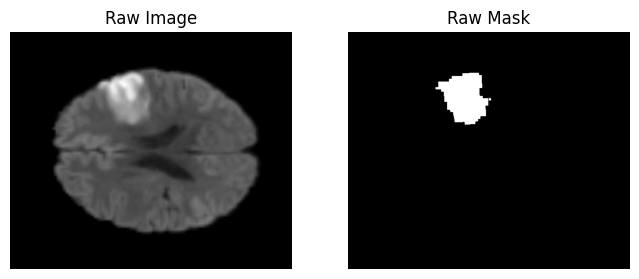

Sample 14 | Image shape: (512, 558, 65) | Mask shape: (512, 558, 65)


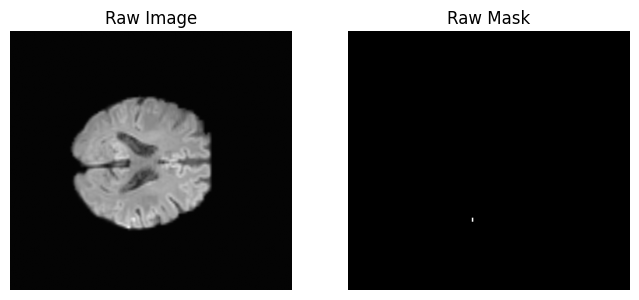


🟢 PREPROCESSED SAMPLES
Sample 81 | Image shape: (192, 192, 192) | Mask shape: (192, 192, 192)


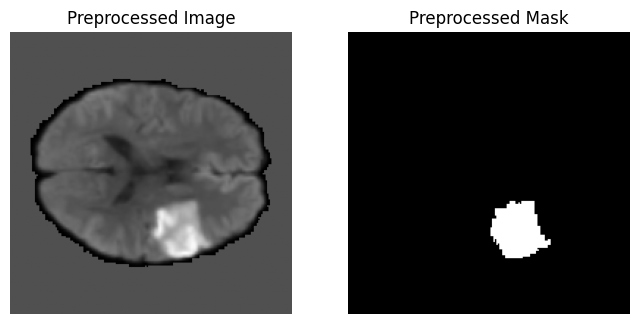

Sample 14 | Image shape: (192, 192, 192) | Mask shape: (192, 192, 192)


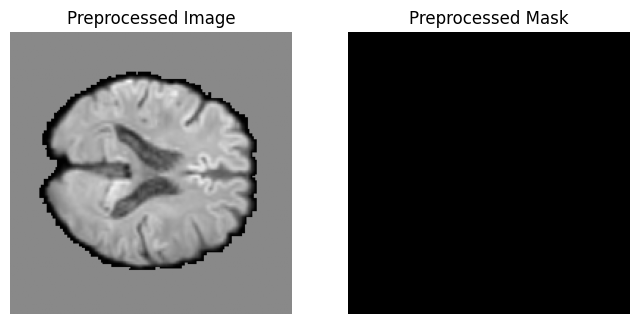


Dataset size: 100

Client 0 (ISLES22-75)
D:/F25-156/Combined/ISLES22 Split 75\train\client_0
D:/F25-156/Combined/ISLES22 Split 75 Preprocessed\train\client_0
Original samples: 75 | Preprocessed samples: 75

🔵 RAW SAMPLES
Sample 3 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72)


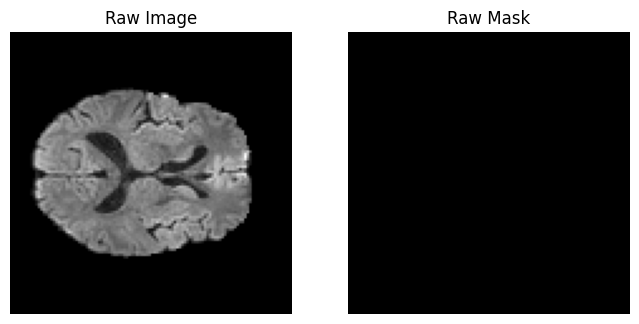

Sample 35 | Image shape: (112, 112, 73) | Mask shape: (112, 112, 73)


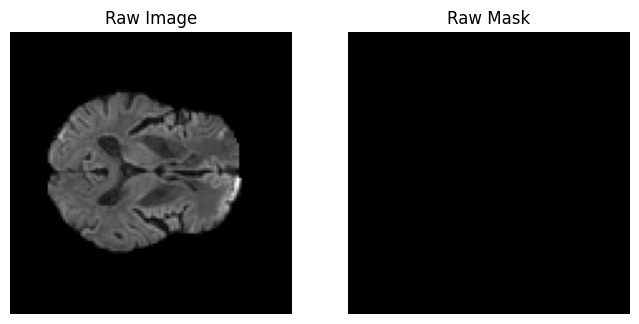


🟢 PREPROCESSED SAMPLES
Sample 3 | Image shape: (192, 192, 192) | Mask shape: (192, 192, 192)


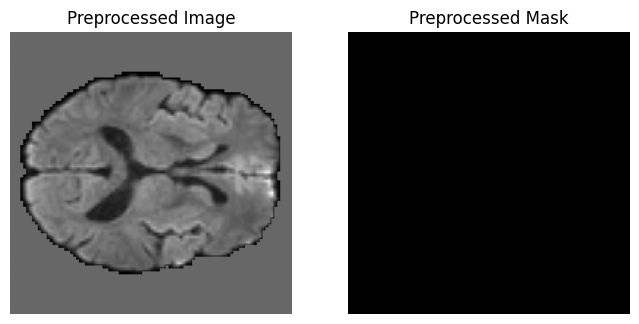

Sample 35 | Image shape: (192, 192, 192) | Mask shape: (192, 192, 192)


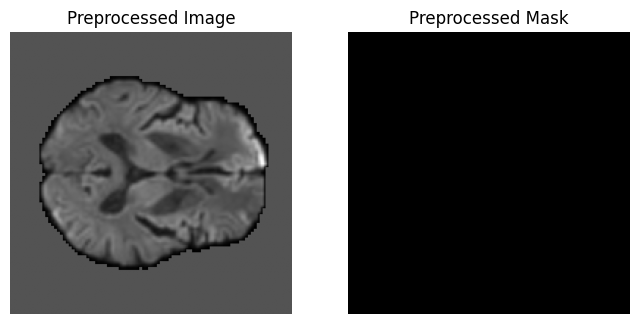


Dataset size: 75

Client 1 (ISLES22-75)
D:/F25-156/Combined/ISLES22 Split 75\train\client_1
D:/F25-156/Combined/ISLES22 Split 75 Preprocessed\train\client_1
Original samples: 75 | Preprocessed samples: 75

🔵 RAW SAMPLES
Sample 31 | Image shape: (112, 112, 73) | Mask shape: (112, 112, 73)


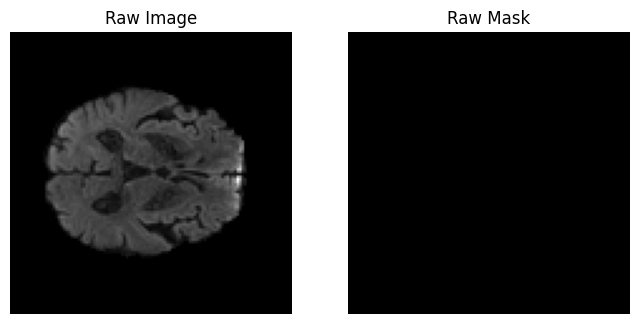

Sample 28 | Image shape: (112, 112, 73) | Mask shape: (112, 112, 73)


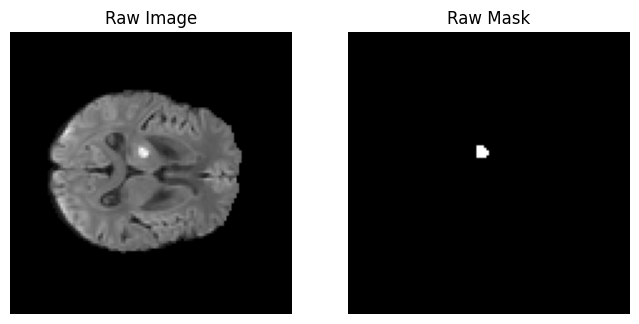


🟢 PREPROCESSED SAMPLES
Sample 31 | Image shape: (192, 192, 192) | Mask shape: (192, 192, 192)


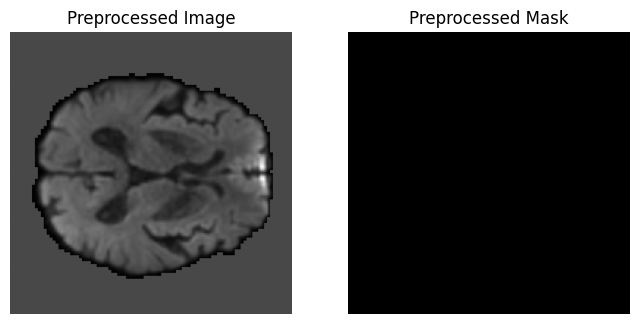

Sample 28 | Image shape: (192, 192, 192) | Mask shape: (192, 192, 192)


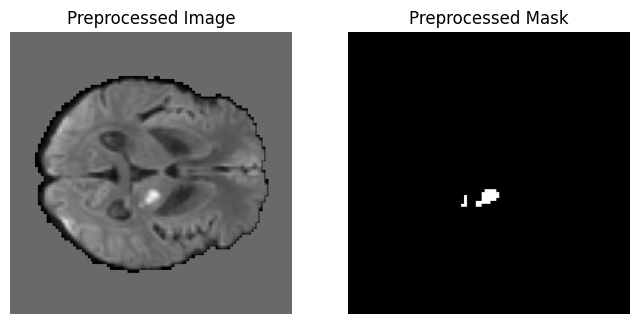


Dataset size: 75


In [12]:
clients = [
    {
        "name": "Client 0 (ISLES24)",
        "orig_root": "D:/F25-156/Combined/ISLES24 Split 100" ,
        "proc_root": "D:/F25-156/Combined/ISLES24 Split 100 Preprocessed",
        "client_id": 0,
        "split": "train",
    },
    {
        "name": "Client 0 (ISLES22-75)",
        "orig_root": "D:/F25-156/Combined/ISLES22 Split 75",
        "proc_root": "D:/F25-156/Combined/ISLES22 Split 75 Preprocessed",
        "client_id": 0,  
        "split": "train",
    },
    {
        "name": "Client 1 (ISLES22-75)",
        "orig_root": "D:/F25-156/Combined/ISLES22 Split 75",
        "proc_root": "D:/F25-156/Combined/ISLES22 Split 75 Preprocessed",
        "client_id": 1,   
        "split": "train",
    },
]
num_clients=len(clients)
print("Number of Clients ", num_clients)

client_datasets = []

for client in clients:

    print("\n" + "="*60)
    print(client["name"])
    print("="*60)

    # ORIGINAL
    orig_dir = os.path.join(
        client["orig_root"], "train", f"client_{client['client_id']}"
    )
    print(orig_dir)

    dwi_files, mask_files = load_dwi_mask_pairs(orig_dir)

    # PREPROCESSED
    proc_dir = os.path.join(
        client["proc_root"], "train", f"client_{client['client_id']}"
    )
    print(proc_dir)
    proc_dwi, proc_mask = load_dwi_mask_pairs(proc_dir)

    print(f"Original samples: {len(dwi_files)} | Preprocessed samples: {len(proc_dwi)}")

    # Random samples
    sample_indices = random.sample(range(len(dwi_files)), k=min(2, len(dwi_files)))

    # RAW VIS
    print("\n🔵 RAW SAMPLES")
    for idx in sample_indices:
        img = nib.load(dwi_files[idx]).get_fdata()
        mask = nib.load(mask_files[idx]).get_fdata()

        print(f"Sample {idx} | Image shape: {img.shape} | Mask shape: {mask.shape}")

        mid = img.shape[2] // 2

        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img[:,:,mid], cmap="gray")
        plt.title("Raw Image")
        plt.axis("off")

        plt.subplot(1,2,2)
        plt.imshow(mask[:,:,mid], cmap="gray")
        plt.title("Raw Mask")
        plt.axis("off")
        plt.show()

    # PREPROCESSED VIS
    print("\n🟢 PREPROCESSED SAMPLES")

    ds = ISLESDataset(
        dwi_files=proc_dwi,
        mask_files=proc_mask,
        transform=transform,
    )

    client_datasets.append(ds)

    for idx in sample_indices:
        sample = ds[idx]

        img_proc = sample["image"][0].numpy()
        mask_proc = sample["mask"][0].numpy()

        print(f"Sample {idx} | Image shape: {img_proc.shape} | Mask shape: {mask_proc.shape}")

        mid = img_proc.shape[2] // 2

        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img_proc[:,:,mid], cmap="gray")
        plt.title("Preprocessed Image")
        plt.axis("off")

        plt.subplot(1,2,2)
        plt.imshow(mask_proc[:,:,mid], cmap="gray")
        plt.title("Preprocessed Mask")
        plt.axis("off")
        plt.show()

    print(f"\nDataset size: {len(ds)}")

**Validation Set**

In [13]:
val_sets = {
    "ISLES22": "D:/F25-156/Combined/ISLES22 Split 75 Preprocessed/val",
    "ISLES24": "D:/F25-156/Combined/ISLES24 Split 100 Preprocessed/val",
}

val_loaders = {}

for name, path in val_sets.items():

    val_dwi, val_mask = load_dwi_mask_pairs(path)

    dataset = ISLESDataset(
        dwi_files=val_dwi,
        mask_files=val_mask,
        transform=transform,
    )

    loader = DataLoader(dataset, batch_size=1, shuffle=False)

    val_loaders[name] = loader

    print(f"{name} validation samples:", len(dataset))

ISLES22 validation samples: 50
ISLES24 validation samples: 24


In [14]:
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


In [15]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda:0


## SegResNet

In [16]:
def create_model():
    model = SegResNet(
        spatial_dims=3,
        in_channels=1,          # DWI is single channel
        out_channels=1,         # Binary lesion mask
        init_filters=16,        # similar starting capacity as UNet
        blocks_down=(1, 2, 2, 4),
        blocks_up=(1, 1, 1),
        dropout_prob=0.2
    ).to(device)
    print(model)
    return model

**Client Class**

In [17]:
class Client:
    def __init__(self, client_id, dataset, device, mu=0.01):
        self.id = client_id
        self.loader = DataLoader(dataset, batch_size=1, shuffle=True)
        self.dataset = dataset
        self.device = device
        self.model = create_model().to(device)
        self.optimizer = optim.Adam(self.model.parameters(), lr=1e-4)
        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.mu = mu   # FedProx coefficient

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + 0.3*self.bce_loss(y_pred, y_true)

    def get_parameters(self):
        return {k: v.cpu().clone() for k, v in self.model.state_dict().items()}

    def set_parameters(self, parameters):
        self.model.load_state_dict(parameters)

    def get_data_size(self):
        return len(self.dataset)
    
    def train_epochs(self, num_epochs=1):
        self.model.train()
        total_loss = 0

        # store global parameters
        global_params = [param.clone().detach() for param in self.model.parameters()]
        
        # Progress bar for epochs
        for epoch in tqdm(range(1, num_epochs + 1), desc=f"Client {self.id} Epochs", leave=True):
            epoch_loss = 0

            for batch in self.loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                self.optimizer.zero_grad()
                outputs = self.model(images)
                loss = self.loss_fn(outputs, masks)

                # FedProx proximal term 
                prox_term = 0.0
                for param, global_param in zip(self.model.parameters(), global_params):
                    prox_term += torch.norm(param - global_param) ** 2

                loss = loss + (self.mu / 2) * prox_term

                loss.backward()
                self.optimizer.step()

                total_loss += loss.item()
                epoch_loss += loss.item()

                # Metrics for monitoring
                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

            # Compute metrics at the end of the epoch
            mean_dice = self.dice_metric.aggregate().item()
            # mean_hd95 = self.hd_metric.aggregate().item()
            try:
                mean_hd95 = self.hd_metric.aggregate().item()
            except ValueError:
                mean_hd95 = float('nan')  # or 0
            mean_iou = mean_dice / (2 - mean_dice)

            # Print per-epoch metrics
            print(f"Client {self.id} | Epoch {epoch}/{num_epochs} | "
                  f"Loss: {epoch_loss/len(self.loader):.4f} | Dice: {mean_dice:.4f} | "
                  f"IoU: {mean_iou:.4f} | HD95: {mean_hd95:.4f}")

            # Reset metrics for next epoch
            self.dice_metric.reset()
            self.hd_metric.reset()

        # Average loss across all epochs
        avg_loss = total_loss / (len(self.loader) * num_epochs)

        # Return last epoch metrics
        return {
            "state_dict": self.get_parameters(),
            "n_samples": self.get_data_size(),
            "loss": avg_loss,
            "dice": mean_dice,
            "iou": mean_iou,
            "hd95": mean_hd95,
        }
    
    def train_epochs_personalization(self, num_epochs=1):
        self.model.train()
        total_loss = 0

        self.dice_metric.reset()
        self.hd_metric.reset()

        # Progress bar for epochs
        for epoch in tqdm(range(1, num_epochs + 1), desc=f"Client {self.id} Epochs", leave=True):
            epoch_loss = 0

            for batch in self.loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                self.optimizer.zero_grad()
                outputs = self.model(images)
                loss = self.loss_fn(outputs, masks)

                loss.backward()
                self.optimizer.step()

                total_loss += loss.item()
                epoch_loss += loss.item()

                # Metrics for monitoring
                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

            # Compute metrics at the end of the epoch
            mean_dice = self.dice_metric.aggregate().item()
            # mean_hd95 = self.hd_metric.aggregate().item()
            try:
                mean_hd95 = self.hd_metric.aggregate().item()
            except ValueError:
                mean_hd95 = float('nan')  # or 0
            mean_iou = mean_dice / (2 - mean_dice)

            # Print per-epoch metrics
            print(f"Client {self.id} | Epoch {epoch}/{num_epochs} | "
                  f"Loss: {epoch_loss/len(self.loader):.4f} | Dice: {mean_dice:.4f} | "
                  f"IoU: {mean_iou:.4f} | HD95: {mean_hd95:.4f}")

            # Reset metrics for next epoch
            self.dice_metric.reset()
            self.hd_metric.reset()

        # Average loss across all epochs
        avg_loss = total_loss / (len(self.loader) * num_epochs)

        # Return last epoch metrics
        return {
            "loss": avg_loss,
            "dice": mean_dice,
            "iou": mean_iou,
            "hd95": mean_hd95,
        }

**Server Class**

In [18]:
class Server:
    def __init__(self, val_loader, device):
        self.device = device
        self.global_model = create_model().to(device)
        self.val_loader = val_loader

        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.best_dice = 0.0

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + \
               0.3*self.bce_loss(y_pred, y_true)

    def aggregate(self, client_params):
        """
        client_params: list of dicts
        [
            {"params": state_dict_client0, "n_samples": 120},
            {"params": state_dict_client1, "n_samples": 80},
            {"params": state_dict_client2, "n_samples": 50},
        ]
        """

        new_params = {}
        total_samples = sum(c["n_samples"] for c in client_params)

        for key in client_params[0]["params"].keys():

            param = client_params[0]["params"][key]

            if torch.is_floating_point(param):

                weighted_sum = torch.zeros_like(param)

                for client in client_params:
                    weight = client["n_samples"] / total_samples
                    weighted_sum += client["params"][key].to(param.device) * weight

                new_params[key] = weighted_sum

            else:
                new_params[key] = param.clone()

        self.global_model.load_state_dict(new_params)

    def distribute(self, clients):
        global_params = self.global_model.state_dict()
        for client in clients:
            client.set_parameters(global_params)

    def validate(self):
        self.global_model.eval()

        results = {}

        for name, loader in self.val_loader.items():

            val_loss = 0
            self.dice_metric.reset()
            self.hd_metric.reset()

            with torch.no_grad():
                for batch in loader:
                    images = batch["image"].to(self.device, dtype=torch.float32)
                    masks = batch["mask"].to(self.device, dtype=torch.float32)

                    outputs = self.global_model(images)
                    loss = self.loss_fn(outputs, masks)
                    val_loss += loss.item()

                    pred_binary = (torch.sigmoid(outputs) > 0.5).float()

                    self.dice_metric(pred_binary, masks)

                    if masks.sum() > 0 and pred_binary.sum() > 0:
                        self.hd_metric(pred_binary, masks)

            avg_loss = val_loss / len(loader)
            mean_dice = self.dice_metric.aggregate().item()

            try:
                mean_hd95 = self.hd_metric.aggregate().item()
            except ValueError:
                mean_hd95 = float('nan')

            mean_iou = mean_dice / (2 - mean_dice)

            results[name] = {
                "loss": avg_loss,
                "dice": mean_dice,
                "iou": mean_iou,
                "hd95": mean_hd95,
            }

            print(f"\n{name} → Loss: {avg_loss:.4f} | Dice: {mean_dice:.4f} | IoU: {mean_iou:.4f} | HD95: {mean_hd95:.4f}")

        # ---- model selection ----
        # use mean Dice across datasets
        avg_dice = sum(r["dice"] for r in results.values()) / len(results)

        if avg_dice > self.best_dice:
            self.best_dice = avg_dice
            torch.save({
                "model_state_dict": self.global_model.state_dict(),
                "dice": avg_dice
            }, "best_global_model.pth")

            print(f"\n✅ Best global model updated (Mean Dice={avg_dice:.4f})")

        return results

In [19]:
#create client and server objects
clients = [
    Client(client_id=i, dataset=client_datasets[i], device=device)
    for i in range(num_clients)
]

server = Server(val_loader=val_loaders, device=device) #val_loaders (2 val sets now)

SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 32, eps=1e-05, a

**Federated Training loop**

In [20]:
communication_rounds = 10  # upper bound
local_epochs = 20
dice_threshold = 0.001

# ---- Added early stopping tracking ----
no_improve_rounds = 0
patience = 2   # stop if Dice does not improve for 2 rounds
# --------------------------------------

global_history = {"dice": [], "loss": [], "iou": [], "hd95": []}
client_history = {client.id: {"loss": [], "dice": [], "iou": [], "hd95": []} for client in clients}

previous_dice = 0

for round_num in range(1, communication_rounds + 1):

    print(f"\n\n-- Communication Round {round_num} ---")

    # ---- Distribute global model ----
    server.distribute(clients)

    client_params = []

    # ---- Local Training ----
    for client in tqdm(clients, desc="Clients Training", leave=False):

        # train_epochs already runs for `local_epochs`
        client_update = client.train_epochs(local_epochs)
        train_loss=client_update["loss"]
        train_dice=client_update["dice"]
        train_iou=client_update["iou"]
        train_hd95=client_update["hd95"]

        # Save per-client metrics
        client_history[client.id]["loss"].append(train_loss)
        client_history[client.id]["dice"].append(train_dice)
        client_history[client.id]["iou"].append(train_iou)
        client_history[client.id]["hd95"].append(train_hd95)

        # TensorBoard logging
        writer.add_scalar(f"Client_{client.id}/Loss", train_loss, round_num)
        writer.add_scalar(f"Client_{client.id}/Dice", train_dice, round_num)
        writer.add_scalar(f"Client_{client.id}/IoU", train_iou, round_num)
        writer.add_scalar(f"Client_{client.id}/HD95", train_hd95, round_num)

        client_params.append({
            "params": client_update["state_dict"],
            "n_samples": client_update["n_samples"]
        })

        tqdm.write(f"Client {client.id} | Loss={train_loss:.4f} | Dice={train_dice:.4f} | IoU={train_iou:.4f} | HD95={train_hd95:.4f}")
    # ---- Aggregate client models ----
    server.aggregate(client_params)

    # ---- Validation on global model ----
    results = server.validate()

    # store mean Dice for early stopping
    dice_values = []

    for name, r in results.items():

        if name not in global_history:
            global_history[name] = {"loss": [], "dice": [], "iou": [], "hd95": []}

        global_history[name]["loss"].append(r["loss"])
        global_history[name]["dice"].append(r["dice"])
        global_history[name]["iou"].append(r["iou"])
        global_history[name]["hd95"].append(r["hd95"])

        dice_values.append(r["dice"])

        # ✅ TensorBoard per dataset
        writer.add_scalar(f"Global/{name}/Loss", r["loss"], round_num)
        writer.add_scalar(f"Global/{name}/Dice", r["dice"], round_num)
        writer.add_scalar(f"Global/{name}/IoU", r["iou"], round_num)
        writer.add_scalar(f"Global/{name}/HD95", r["hd95"], round_num)

        print(f"{name} | Loss={r['loss']:.4f} | Dice={r['dice']:.4f} | IoU={r['iou']:.4f} | HD95={r['hd95']:.4f}")

    # ---- Mean Dice (used for early stopping + checkpointing) ----
    mean_dice = sum(dice_values) / len(dice_values)

    print(f"\nGlobal Mean Dice: {mean_dice:.4f}")

    # ---- Save checkpoint ----
    checkpoint_path = os.path.join(checkpoint_dir, f"federated_round{round_num}.pth")

    torch.save({
        "round": round_num,
        "global_model_state_dict": server.global_model.state_dict(),
        "results": results,   # ✅ save all datasets
        "mean_dice": mean_dice,
        "client_history": client_history
    }, checkpoint_path)

    print(f"Checkpoint saved for round {round_num} at {checkpoint_path}")

    # ---- Early stopping ----
    if mean_dice > previous_dice + dice_threshold:
        no_improve_rounds = 0
    else:
        no_improve_rounds += 1
        print(f"No significant Dice improvement for {no_improve_rounds} round(s)")

    if no_improve_rounds >= patience:
        print(f"Early stopping triggered at round {round_num}")
        break

    previous_dice = mean_dice



-- Communication Round 1 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.8426 | Dice: 0.1362 | IoU: 0.0731 | HD95: 93.0582


Client 0 | Epoch 2/20 | Loss: 0.8226 | Dice: 0.2024 | IoU: 0.1126 | HD95: 85.8224


Client 0 | Epoch 3/20 | Loss: 0.8131 | Dice: 0.2224 | IoU: 0.1251 | HD95: 83.5834


Client 0 | Epoch 4/20 | Loss: 0.8057 | Dice: 0.2292 | IoU: 0.1294 | HD95: 85.9875


Client 0 | Epoch 5/20 | Loss: 0.7957 | Dice: 0.2439 | IoU: 0.1389 | HD95: 83.7016


Client 0 | Epoch 6/20 | Loss: 0.7886 | Dice: 0.2567 | IoU: 0.1472 | HD95: 83.1013


Client 0 | Epoch 7/20 | Loss: 0.7813 | Dice: 0.2770 | IoU: 0.1608 | HD95: 81.0776


Client 0 | Epoch 8/20 | Loss: 0.7746 | Dice: 0.2852 | IoU: 0.1663 | HD95: 82.7234


Client 0 | Epoch 9/20 | Loss: 0.7684 | Dice: 0.2652 | IoU: 0.1529 | HD95: 84.0246


Client 0 | Epoch 10/20 | Loss: 0.7626 | Dice: 0.2827 | IoU: 0.1646 | HD95: 81.4080


Client 0 | Epoch 11/20 | Loss: 0.7573 | Dice: 0.3037 | IoU: 0.1790 | HD95: 78.3204


Client 0 | Epoch 12/20 | Loss: 0.7521 | Dice: 0.2880 | IoU: 0.1682 | HD95: 81.2559


Client 0 | Epoch 13/20 | Loss: 0.7477 | Dice: 0.2812 | IoU: 0.1636 | HD95: 82.3959


Client 0 | Epoch 14/20 | Loss: 0.7400 | Dice: 0.3136 | IoU: 0.1859 | HD95: 74.2957


Client 0 | Epoch 15/20 | Loss: 0.7365 | Dice: 0.3249 | IoU: 0.1939 | HD95: 72.6475


Client 0 | Epoch 16/20 | Loss: 0.7294 | Dice: 0.3353 | IoU: 0.2014 | HD95: 73.1482


Client 0 | Epoch 17/20 | Loss: 0.7252 | Dice: 0.3334 | IoU: 0.2001 | HD95: 75.8836


Client 0 | Epoch 18/20 | Loss: 0.7205 | Dice: 0.3317 | IoU: 0.1988 | HD95: 70.7719


Client 0 | Epoch 19/20 | Loss: 0.7151 | Dice: 0.3338 | IoU: 0.2003 | HD95: 64.2228


Clients Training:  33%|███▎      | 1/3 [52:19<1:44:39, 3139.86s/it]

Client 0 | Epoch 20/20 | Loss: 0.7138 | Dice: 0.3135 | IoU: 0.1859 | HD95: 69.5067
Client 0 | Loss=0.7646 | Dice=0.3135 | IoU=0.1859 | HD95=69.5067


Client 1 | Epoch 1/20 | Loss: 0.8492 | Dice: 0.1189 | IoU: 0.0632 | HD95: 79.1066


Client 1 | Epoch 2/20 | Loss: 0.8244 | Dice: 0.2018 | IoU: 0.1122 | HD95: 73.0386


Client 1 | Epoch 3/20 | Loss: 0.8159 | Dice: 0.2358 | IoU: 0.1336 | HD95: 72.2454


Client 1 | Epoch 4/20 | Loss: 0.8076 | Dice: 0.2591 | IoU: 0.1488 | HD95: 71.1082


Client 1 | Epoch 5/20 | Loss: 0.8026 | Dice: 0.2519 | IoU: 0.1441 | HD95: 71.1722


Client 1 | Epoch 6/20 | Loss: 0.7951 | Dice: 0.2762 | IoU: 0.1602 | HD95: 71.5752


Client 1 | Epoch 7/20 | Loss: 0.7918 | Dice: 0.2576 | IoU: 0.1478 | HD95: 70.3863


Client 1 | Epoch 8/20 | Loss: 0.7858 | Dice: 0.2635 | IoU: 0.1517 | HD95: 71.5127


Client 1 | Epoch 9/20 | Loss: 0.7812 | Dice: 0.2606 | IoU: 0.1498 | HD95: 70.4255


Client 1 | Epoch 10/20 | Loss: 0.7750 | Dice: 0.2841 | IoU: 0.1656 | HD95: 71.3735


Client 1 | Epoch 11/20 | Loss: 0.7702 | Dice: 0.2761 | IoU: 0.1602 | HD95: 70.6321


Client 1 | Epoch 12/20 | Loss: 0.7656 | Dice: 0.2778 | IoU: 0.1613 | HD95: 70.7713


Client 1 | Epoch 13/20 | Loss: 0.7613 | Dice: 0.2881 | IoU: 0.1683 | HD95: 69.8071


Client 1 | Epoch 14/20 | Loss: 0.7561 | Dice: 0.3037 | IoU: 0.1790 | HD95: 67.9584


Client 1 | Epoch 15/20 | Loss: 0.7526 | Dice: 0.2715 | IoU: 0.1571 | HD95: 69.3149


Client 1 | Epoch 16/20 | Loss: 0.7492 | Dice: 0.2727 | IoU: 0.1579 | HD95: 69.4875


Client 1 | Epoch 17/20 | Loss: 0.7444 | Dice: 0.3020 | IoU: 0.1778 | HD95: 69.0860


Client 1 | Epoch 18/20 | Loss: 0.7410 | Dice: 0.2680 | IoU: 0.1548 | HD95: 67.6399


Client 1 | Epoch 19/20 | Loss: 0.7392 | Dice: 0.2618 | IoU: 0.1506 | HD95: 69.5492


Clients Training:  67%|██████▋   | 2/3 [1:29:49<43:35, 2615.95s/it]  

Client 1 | Epoch 20/20 | Loss: 0.7338 | Dice: 0.2852 | IoU: 0.1663 | HD95: 68.4231
Client 1 | Loss=0.7771 | Dice=0.2852 | IoU=0.1663 | HD95=68.4231


Client 2 | Epoch 1/20 | Loss: 0.8469 | Dice: 0.1673 | IoU: 0.0913 | HD95: 86.2648


Client 2 | Epoch 2/20 | Loss: 0.8222 | Dice: 0.2511 | IoU: 0.1436 | HD95: 69.9594


Client 2 | Epoch 3/20 | Loss: 0.8128 | Dice: 0.2882 | IoU: 0.1684 | HD95: 68.1750


Client 2 | Epoch 4/20 | Loss: 0.8045 | Dice: 0.3301 | IoU: 0.1977 | HD95: 65.8450


Client 2 | Epoch 5/20 | Loss: 0.7989 | Dice: 0.3283 | IoU: 0.1964 | HD95: 66.1537


Client 2 | Epoch 6/20 | Loss: 0.7928 | Dice: 0.3324 | IoU: 0.1993 | HD95: 65.8155


Client 2 | Epoch 7/20 | Loss: 0.7884 | Dice: 0.3350 | IoU: 0.2012 | HD95: 66.5448


Client 2 | Epoch 8/20 | Loss: 0.7824 | Dice: 0.3526 | IoU: 0.2140 | HD95: 64.7268


Client 2 | Epoch 9/20 | Loss: 0.7774 | Dice: 0.3386 | IoU: 0.2038 | HD95: 65.7101


Client 2 | Epoch 10/20 | Loss: 0.7738 | Dice: 0.3285 | IoU: 0.1965 | HD95: 65.6535


Client 2 | Epoch 11/20 | Loss: 0.7672 | Dice: 0.3490 | IoU: 0.2114 | HD95: 65.7198


Client 2 | Epoch 12/20 | Loss: 0.7633 | Dice: 0.3506 | IoU: 0.2126 | HD95: 65.4894


Client 2 | Epoch 13/20 | Loss: 0.7591 | Dice: 0.3289 | IoU: 0.1968 | HD95: 64.5855


Client 2 | Epoch 14/20 | Loss: 0.7527 | Dice: 0.3540 | IoU: 0.2150 | HD95: 65.0544


Client 2 | Epoch 15/20 | Loss: 0.7496 | Dice: 0.3626 | IoU: 0.2214 | HD95: 64.5923


Client 2 | Epoch 16/20 | Loss: 0.7463 | Dice: 0.3410 | IoU: 0.2055 | HD95: 66.4470


Client 2 | Epoch 17/20 | Loss: 0.7418 | Dice: 0.3525 | IoU: 0.2140 | HD95: 65.3300


Client 2 | Epoch 18/20 | Loss: 0.7391 | Dice: 0.3094 | IoU: 0.1830 | HD95: 67.1121


Client 2 | Epoch 19/20 | Loss: 0.7353 | Dice: 0.3476 | IoU: 0.2104 | HD95: 65.0066


Client 2 Epochs: 100%|██████████| 20/20 [37:49<00:00, 113.47s/it]
                                                                   

Client 2 | Epoch 20/20 | Loss: 0.7345 | Dice: 0.3200 | IoU: 0.1905 | HD95: 66.0070
Client 2 | Loss=0.7745 | Dice=0.3200 | IoU=0.1905 | HD95=66.0070



ISLES22 → Loss: 0.7266 | Dice: 0.2617 | IoU: 0.1505 | HD95: 73.1099

ISLES24 → Loss: 0.6993 | Dice: 0.3779 | IoU: 0.2330 | HD95: 56.5640

✅ Best global model updated (Mean Dice=0.3198)
ISLES22 | Loss=0.7266 | Dice=0.2617 | IoU=0.1505 | HD95=73.1099
ISLES24 | Loss=0.6993 | Dice=0.3779 | IoU=0.2330 | HD95=56.5640

Global Mean Dice: 0.3198
Checkpoint saved for round 1 at D:/F25-156/SegResNet/Federated_SegResNet_checkpoints\federated_round1.pth


-- Communication Round 2 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.7196 | Dice: 0.2733 | IoU: 0.1583 | HD95: 79.7466


Client 0 | Epoch 2/20 | Loss: 0.7098 | Dice: 0.3059 | IoU: 0.1806 | HD95: 77.4298


Client 0 | Epoch 3/20 | Loss: 0.7043 | Dice: 0.3277 | IoU: 0.1959 | HD95: 72.4558


Client 0 | Epoch 4/20 | Loss: 0.6960 | Dice: 0.3571 | IoU: 0.2173 | HD95: 65.1732


Client 0 | Epoch 5/20 | Loss: 0.6886 | Dice: 0.3684 | IoU: 0.2258 | HD95: 63.0665


Client 0 | Epoch 6/20 | Loss: 0.6871 | Dice: 0.3312 | IoU: 0.1985 | HD95: 68.6941


Client 0 | Epoch 7/20 | Loss: 0.6791 | Dice: 0.3549 | IoU: 0.2157 | HD95: 68.0376


Client 0 | Epoch 8/20 | Loss: 0.6730 | Dice: 0.3841 | IoU: 0.2377 | HD95: 64.2185


Client 0 | Epoch 9/20 | Loss: 0.6681 | Dice: 0.3664 | IoU: 0.2243 | HD95: 65.2063


Client 0 | Epoch 10/20 | Loss: 0.6624 | Dice: 0.3645 | IoU: 0.2228 | HD95: 64.6701


Client 0 | Epoch 11/20 | Loss: 0.6524 | Dice: 0.3914 | IoU: 0.2433 | HD95: 60.2684


Client 0 | Epoch 12/20 | Loss: 0.6484 | Dice: 0.3556 | IoU: 0.2163 | HD95: 65.5895


Client 0 | Epoch 13/20 | Loss: 0.6485 | Dice: 0.3445 | IoU: 0.2081 | HD95: 68.5777


Client 0 | Epoch 14/20 | Loss: 0.6369 | Dice: 0.3656 | IoU: 0.2237 | HD95: 64.6814


Client 0 | Epoch 15/20 | Loss: 0.6194 | Dice: 0.4254 | IoU: 0.2702 | HD95: 54.1251


Client 0 | Epoch 16/20 | Loss: 0.6282 | Dice: 0.3933 | IoU: 0.2448 | HD95: 60.1365


Client 0 | Epoch 17/20 | Loss: 0.6062 | Dice: 0.4358 | IoU: 0.2786 | HD95: 52.9336


Client 0 | Epoch 18/20 | Loss: 0.5928 | Dice: 0.4436 | IoU: 0.2850 | HD95: 56.1964


Client 0 | Epoch 19/20 | Loss: 0.5810 | Dice: 0.4540 | IoU: 0.2937 | HD95: 51.3269


Clients Training:  33%|███▎      | 1/3 [50:27<1:40:54, 3027.03s/it]

Client 0 | Epoch 20/20 | Loss: 0.5687 | Dice: 0.4875 | IoU: 0.3223 | HD95: 50.5975
Client 0 | Loss=0.6535 | Dice=0.4875 | IoU=0.3223 | HD95=50.5975


Client 1 | Epoch 1/20 | Loss: 0.7162 | Dice: 0.2795 | IoU: 0.1625 | HD95: 69.4291


Client 1 | Epoch 2/20 | Loss: 0.7116 | Dice: 0.2861 | IoU: 0.1669 | HD95: 68.5323


Client 1 | Epoch 3/20 | Loss: 0.7085 | Dice: 0.3042 | IoU: 0.1794 | HD95: 66.5630


Client 1 | Epoch 4/20 | Loss: 0.7069 | Dice: 0.2646 | IoU: 0.1525 | HD95: 68.9063


Client 1 | Epoch 5/20 | Loss: 0.7018 | Dice: 0.2869 | IoU: 0.1675 | HD95: 67.5699


Client 1 | Epoch 6/20 | Loss: 0.6976 | Dice: 0.2933 | IoU: 0.1718 | HD95: 67.2534


Client 1 | Epoch 7/20 | Loss: 0.6939 | Dice: 0.3033 | IoU: 0.1788 | HD95: 66.8235


Client 1 | Epoch 8/20 | Loss: 0.6912 | Dice: 0.2999 | IoU: 0.1764 | HD95: 69.0731


Client 1 | Epoch 9/20 | Loss: 0.6939 | Dice: 0.2552 | IoU: 0.1463 | HD95: 69.4215


Client 1 | Epoch 10/20 | Loss: 0.6850 | Dice: 0.2879 | IoU: 0.1681 | HD95: 69.1696


Client 1 | Epoch 11/20 | Loss: 0.6820 | Dice: 0.3024 | IoU: 0.1781 | HD95: 68.1023


Client 1 | Epoch 12/20 | Loss: 0.6797 | Dice: 0.2858 | IoU: 0.1667 | HD95: 67.5928


Client 1 | Epoch 13/20 | Loss: 0.6741 | Dice: 0.3115 | IoU: 0.1845 | HD95: 68.0052


Client 1 | Epoch 14/20 | Loss: 0.6765 | Dice: 0.2788 | IoU: 0.1620 | HD95: 69.2382


Client 1 | Epoch 15/20 | Loss: 0.6672 | Dice: 0.3173 | IoU: 0.1886 | HD95: 65.0862


Client 1 | Epoch 16/20 | Loss: 0.6639 | Dice: 0.2835 | IoU: 0.1652 | HD95: 68.9378


Client 1 | Epoch 17/20 | Loss: 0.6606 | Dice: 0.3027 | IoU: 0.1784 | HD95: 67.4327


Client 1 | Epoch 18/20 | Loss: 0.6583 | Dice: 0.2993 | IoU: 0.1760 | HD95: 68.4515


Client 1 | Epoch 19/20 | Loss: 0.6606 | Dice: 0.2759 | IoU: 0.1600 | HD95: 68.7176


Clients Training:  67%|██████▋   | 2/3 [1:27:27<42:32, 2552.32s/it]  

Client 1 | Epoch 20/20 | Loss: 0.6490 | Dice: 0.3095 | IoU: 0.1831 | HD95: 67.0269
Client 1 | Loss=0.6839 | Dice=0.3095 | IoU=0.1831 | HD95=67.0269


Client 2 | Epoch 1/20 | Loss: 0.7130 | Dice: 0.3298 | IoU: 0.1974 | HD95: 64.9058


Client 2 | Epoch 2/20 | Loss: 0.7069 | Dice: 0.3377 | IoU: 0.2031 | HD95: 64.2298


Client 2 | Epoch 3/20 | Loss: 0.7036 | Dice: 0.3385 | IoU: 0.2037 | HD95: 63.6983


Client 2 | Epoch 4/20 | Loss: 0.7008 | Dice: 0.3255 | IoU: 0.1944 | HD95: 64.6085


Client 2 | Epoch 5/20 | Loss: 0.6971 | Dice: 0.3238 | IoU: 0.1932 | HD95: 64.4460


Client 2 | Epoch 6/20 | Loss: 0.6908 | Dice: 0.3573 | IoU: 0.2175 | HD95: 63.2905


Client 2 | Epoch 7/20 | Loss: 0.6879 | Dice: 0.3474 | IoU: 0.2102 | HD95: 63.5375


Client 2 | Epoch 8/20 | Loss: 0.6837 | Dice: 0.3425 | IoU: 0.2067 | HD95: 63.8131


Client 2 | Epoch 9/20 | Loss: 0.6810 | Dice: 0.3440 | IoU: 0.2078 | HD95: 63.3907


Client 2 | Epoch 10/20 | Loss: 0.6784 | Dice: 0.3378 | IoU: 0.2032 | HD95: 62.8929


Client 2 | Epoch 11/20 | Loss: 0.6711 | Dice: 0.3630 | IoU: 0.2217 | HD95: 63.2438


Client 2 | Epoch 12/20 | Loss: 0.6669 | Dice: 0.3781 | IoU: 0.2331 | HD95: 61.6913


Client 2 | Epoch 13/20 | Loss: 0.6648 | Dice: 0.3570 | IoU: 0.2173 | HD95: 63.4620


Client 2 | Epoch 14/20 | Loss: 0.6620 | Dice: 0.3507 | IoU: 0.2126 | HD95: 63.4685


Client 2 | Epoch 15/20 | Loss: 0.6558 | Dice: 0.3659 | IoU: 0.2239 | HD95: 61.9665


Client 2 | Epoch 16/20 | Loss: 0.6487 | Dice: 0.3707 | IoU: 0.2275 | HD95: 61.0420


Client 2 | Epoch 17/20 | Loss: 0.6434 | Dice: 0.3910 | IoU: 0.2430 | HD95: 61.0605


Client 2 | Epoch 18/20 | Loss: 0.6359 | Dice: 0.4057 | IoU: 0.2545 | HD95: 59.3834


Client 2 | Epoch 19/20 | Loss: 0.6351 | Dice: 0.3809 | IoU: 0.2353 | HD95: 59.9839


Client 2 Epochs: 100%|██████████| 20/20 [37:27<00:00, 112.36s/it]
                                                                   

Client 2 | Epoch 20/20 | Loss: 0.6405 | Dice: 0.3564 | IoU: 0.2168 | HD95: 65.1158
Client 2 | Loss=0.6734 | Dice=0.3564 | IoU=0.2168 | HD95=65.1158



ISLES22 → Loss: 0.6456 | Dice: 0.2830 | IoU: 0.1648 | HD95: 70.4471

ISLES24 → Loss: 0.5665 | Dice: 0.4304 | IoU: 0.2742 | HD95: 55.9417

✅ Best global model updated (Mean Dice=0.3567)
ISLES22 | Loss=0.6456 | Dice=0.2830 | IoU=0.1648 | HD95=70.4471
ISLES24 | Loss=0.5665 | Dice=0.4304 | IoU=0.2742 | HD95=55.9417

Global Mean Dice: 0.3567
Checkpoint saved for round 2 at D:/F25-156/SegResNet/Federated_SegResNet_checkpoints\federated_round2.pth


-- Communication Round 3 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.6137 | Dice: 0.3785 | IoU: 0.2334 | HD95: 68.5152


Client 0 | Epoch 2/20 | Loss: 0.5956 | Dice: 0.4065 | IoU: 0.2551 | HD95: 59.2226


Client 0 | Epoch 3/20 | Loss: 0.5922 | Dice: 0.3923 | IoU: 0.2440 | HD95: 63.2465


Client 0 | Epoch 4/20 | Loss: 0.5722 | Dice: 0.4400 | IoU: 0.2820 | HD95: 54.5671


Client 0 | Epoch 5/20 | Loss: 0.5572 | Dice: 0.4733 | IoU: 0.3100 | HD95: 51.6530


Client 0 | Epoch 6/20 | Loss: 0.5449 | Dice: 0.4733 | IoU: 0.3100 | HD95: 54.4398


Client 0 | Epoch 7/20 | Loss: 0.5557 | Dice: 0.4471 | IoU: 0.2879 | HD95: 54.0741


Client 0 | Epoch 8/20 | Loss: 0.5332 | Dice: 0.4773 | IoU: 0.3135 | HD95: 51.6961


Client 0 | Epoch 9/20 | Loss: 0.5217 | Dice: 0.4890 | IoU: 0.3236 | HD95: 49.3288


Client 0 | Epoch 10/20 | Loss: 0.5054 | Dice: 0.5249 | IoU: 0.3558 | HD95: 43.8498


Client 0 | Epoch 11/20 | Loss: 0.4843 | Dice: 0.5556 | IoU: 0.3846 | HD95: 43.4485


Client 0 | Epoch 12/20 | Loss: 0.4793 | Dice: 0.5461 | IoU: 0.3756 | HD95: 42.9578


Client 0 | Epoch 13/20 | Loss: 0.4670 | Dice: 0.5604 | IoU: 0.3893 | HD95: 43.3132


Client 0 | Epoch 14/20 | Loss: 0.4550 | Dice: 0.5607 | IoU: 0.3895 | HD95: 42.2233


Client 0 | Epoch 15/20 | Loss: 0.4562 | Dice: 0.5474 | IoU: 0.3768 | HD95: 42.3659


Client 0 | Epoch 16/20 | Loss: 0.4521 | Dice: 0.5386 | IoU: 0.3685 | HD95: 47.8014


Client 0 | Epoch 17/20 | Loss: 0.4385 | Dice: 0.5649 | IoU: 0.3936 | HD95: 43.0527


Client 0 | Epoch 18/20 | Loss: 0.4182 | Dice: 0.5884 | IoU: 0.4168 | HD95: 37.1672


Client 0 | Epoch 19/20 | Loss: 0.4208 | Dice: 0.5723 | IoU: 0.4008 | HD95: 37.5074


Clients Training:  33%|███▎      | 1/3 [48:32<1:37:05, 2912.78s/it]

Client 0 | Epoch 20/20 | Loss: 0.3942 | Dice: 0.6159 | IoU: 0.4450 | HD95: 37.4413
Client 0 | Loss=0.5029 | Dice=0.6159 | IoU=0.4450 | HD95=37.4413


Client 1 | Epoch 1/20 | Loss: 0.6236 | Dice: 0.3215 | IoU: 0.1915 | HD95: 65.5193


Client 1 | Epoch 2/20 | Loss: 0.6172 | Dice: 0.3252 | IoU: 0.1942 | HD95: 65.8579


Client 1 | Epoch 3/20 | Loss: 0.6092 | Dice: 0.3646 | IoU: 0.2229 | HD95: 64.9859


Client 1 | Epoch 4/20 | Loss: 0.6053 | Dice: 0.3572 | IoU: 0.2175 | HD95: 62.7606


Client 1 | Epoch 5/20 | Loss: 0.6035 | Dice: 0.3751 | IoU: 0.2308 | HD95: 64.5256


Client 1 | Epoch 6/20 | Loss: 0.5956 | Dice: 0.3651 | IoU: 0.2233 | HD95: 62.6201


Client 1 | Epoch 7/20 | Loss: 0.5978 | Dice: 0.3412 | IoU: 0.2057 | HD95: 65.2045


Client 1 | Epoch 8/20 | Loss: 0.5860 | Dice: 0.3813 | IoU: 0.2356 | HD95: 62.6031


Client 1 | Epoch 9/20 | Loss: 0.5871 | Dice: 0.3576 | IoU: 0.2177 | HD95: 61.3611


Client 1 | Epoch 10/20 | Loss: 0.5672 | Dice: 0.4036 | IoU: 0.2528 | HD95: 60.7330


Client 1 | Epoch 11/20 | Loss: 0.5665 | Dice: 0.3901 | IoU: 0.2424 | HD95: 62.1889


Client 1 | Epoch 12/20 | Loss: 0.5549 | Dice: 0.4304 | IoU: 0.2742 | HD95: 55.0429


Client 1 | Epoch 13/20 | Loss: 0.5524 | Dice: 0.4163 | IoU: 0.2629 | HD95: 55.7136


Client 1 | Epoch 14/20 | Loss: 0.5402 | Dice: 0.4589 | IoU: 0.2978 | HD95: 55.5359


Client 1 | Epoch 15/20 | Loss: 0.5394 | Dice: 0.4407 | IoU: 0.2826 | HD95: 54.1389


Client 1 | Epoch 16/20 | Loss: 0.5279 | Dice: 0.4506 | IoU: 0.2908 | HD95: 58.4616


Client 1 | Epoch 17/20 | Loss: 0.5155 | Dice: 0.4859 | IoU: 0.3210 | HD95: 51.5129


Client 1 | Epoch 18/20 | Loss: 0.5066 | Dice: 0.5011 | IoU: 0.3343 | HD95: 49.4055


Client 1 | Epoch 19/20 | Loss: 0.4980 | Dice: 0.5167 | IoU: 0.3483 | HD95: 46.9529


Clients Training:  67%|██████▋   | 2/3 [1:24:54<41:22, 2482.85s/it]  

Client 1 | Epoch 20/20 | Loss: 0.4876 | Dice: 0.5219 | IoU: 0.3531 | HD95: 47.9458
Client 1 | Loss=0.5641 | Dice=0.5219 | IoU=0.3531 | HD95=47.9458


Client 2 | Epoch 1/20 | Loss: 0.6030 | Dice: 0.3998 | IoU: 0.2498 | HD95: 60.5982


Client 2 | Epoch 2/20 | Loss: 0.5964 | Dice: 0.3964 | IoU: 0.2472 | HD95: 60.7255


Client 2 | Epoch 3/20 | Loss: 0.5921 | Dice: 0.4132 | IoU: 0.2604 | HD95: 58.2353


Client 2 | Epoch 4/20 | Loss: 0.5839 | Dice: 0.4098 | IoU: 0.2577 | HD95: 58.9737


Client 2 | Epoch 5/20 | Loss: 0.5737 | Dice: 0.4116 | IoU: 0.2591 | HD95: 60.4075


Client 2 | Epoch 6/20 | Loss: 0.5574 | Dice: 0.4754 | IoU: 0.3118 | HD95: 56.2679


Client 2 | Epoch 7/20 | Loss: 0.5601 | Dice: 0.4367 | IoU: 0.2794 | HD95: 61.1199


Client 2 | Epoch 8/20 | Loss: 0.5450 | Dice: 0.4626 | IoU: 0.3009 | HD95: 57.0388


Client 2 | Epoch 9/20 | Loss: 0.5387 | Dice: 0.4623 | IoU: 0.3007 | HD95: 54.8957


Client 2 | Epoch 10/20 | Loss: 0.5301 | Dice: 0.4788 | IoU: 0.3147 | HD95: 52.3441


Client 2 | Epoch 11/20 | Loss: 0.5223 | Dice: 0.4811 | IoU: 0.3168 | HD95: 50.5723


Client 2 | Epoch 12/20 | Loss: 0.5098 | Dice: 0.4999 | IoU: 0.3332 | HD95: 48.8272


Client 2 | Epoch 13/20 | Loss: 0.4947 | Dice: 0.5248 | IoU: 0.3558 | HD95: 44.0820


Client 2 | Epoch 14/20 | Loss: 0.4892 | Dice: 0.5301 | IoU: 0.3606 | HD95: 46.6398


Client 2 | Epoch 15/20 | Loss: 0.4890 | Dice: 0.5205 | IoU: 0.3518 | HD95: 44.0622


Client 2 | Epoch 16/20 | Loss: 0.4690 | Dice: 0.5531 | IoU: 0.3822 | HD95: 43.0585


Client 2 | Epoch 17/20 | Loss: 0.4592 | Dice: 0.5497 | IoU: 0.3790 | HD95: 38.3033


Client 2 | Epoch 18/20 | Loss: 0.4555 | Dice: 0.5436 | IoU: 0.3733 | HD95: 39.5373


Client 2 | Epoch 19/20 | Loss: 0.4493 | Dice: 0.5554 | IoU: 0.3845 | HD95: 41.1024


Client 2 Epochs: 100%|██████████| 20/20 [36:41<00:00, 110.06s/it]


Client 2 | Epoch 20/20 | Loss: 0.4474 | Dice: 0.5301 | IoU: 0.3607 | HD95: 42.7392
Client 2 | Loss=0.5233 | Dice=0.5301 | IoU=0.3607 | HD95=42.7392

ISLES22 → Loss: 0.4900 | Dice: 0.4226 | IoU: 0.2679 | HD95: 57.6659

ISLES24 → Loss: 0.3734 | Dice: 0.5715 | IoU: 0.4000 | HD95: 49.6951

✅ Best global model updated (Mean Dice=0.4970)
ISLES22 | Loss=0.4900 | Dice=0.4226 | IoU=0.2679 | HD95=57.6659
ISLES24 | Loss=0.3734 | Dice=0.5715 | IoU=0.4000 | HD95=49.6951

Global Mean Dice: 0.4970
Checkpoint saved for round 3 at D:/F25-156/SegResNet/Federated_SegResNet_checkpoints\federated_round3.pth


-- Communication Round 4 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.4208 | Dice: 0.5612 | IoU: 0.3901 | HD95: 42.8217


Client 0 | Epoch 2/20 | Loss: 0.4127 | Dice: 0.5622 | IoU: 0.3910 | HD95: 41.0802


Client 0 | Epoch 3/20 | Loss: 0.4140 | Dice: 0.5561 | IoU: 0.3851 | HD95: 38.1608


Client 0 | Epoch 4/20 | Loss: 0.3861 | Dice: 0.6054 | IoU: 0.4341 | HD95: 37.0229


Client 0 | Epoch 5/20 | Loss: 0.3651 | Dice: 0.6160 | IoU: 0.4450 | HD95: 34.7174


Client 0 | Epoch 6/20 | Loss: 0.3603 | Dice: 0.6175 | IoU: 0.4466 | HD95: 34.8455


Client 0 | Epoch 7/20 | Loss: 0.3415 | Dice: 0.6494 | IoU: 0.4809 | HD95: 26.0250


Client 0 | Epoch 8/20 | Loss: 0.3434 | Dice: 0.6350 | IoU: 0.4652 | HD95: 33.3487


Client 0 | Epoch 9/20 | Loss: 0.3237 | Dice: 0.6638 | IoU: 0.4968 | HD95: 28.1511


Client 0 | Epoch 10/20 | Loss: 0.3634 | Dice: 0.5902 | IoU: 0.4187 | HD95: 33.0763


Client 0 | Epoch 11/20 | Loss: 0.3310 | Dice: 0.6420 | IoU: 0.4728 | HD95: 29.7523


Client 0 | Epoch 12/20 | Loss: 0.3044 | Dice: 0.6757 | IoU: 0.5103 | HD95: 23.8398


Client 0 | Epoch 13/20 | Loss: 0.3203 | Dice: 0.6469 | IoU: 0.4781 | HD95: 30.4083


Client 0 | Epoch 14/20 | Loss: 0.3208 | Dice: 0.6403 | IoU: 0.4709 | HD95: 28.8988


Client 0 | Epoch 15/20 | Loss: 0.3111 | Dice: 0.6541 | IoU: 0.4860 | HD95: 26.8189


Client 0 | Epoch 16/20 | Loss: 0.2922 | Dice: 0.6771 | IoU: 0.5119 | HD95: 22.4913


Client 0 | Epoch 17/20 | Loss: 0.3112 | Dice: 0.6496 | IoU: 0.4810 | HD95: 26.7404


Client 0 | Epoch 18/20 | Loss: 0.2980 | Dice: 0.6715 | IoU: 0.5055 | HD95: 26.7753


Client 0 | Epoch 19/20 | Loss: 0.2828 | Dice: 0.6866 | IoU: 0.5228 | HD95: 21.8052


Clients Training:  33%|███▎      | 1/3 [46:41<1:33:23, 2801.55s/it]

Client 0 | Epoch 20/20 | Loss: 0.2846 | Dice: 0.6808 | IoU: 0.5160 | HD95: 23.6720
Client 0 | Loss=0.3394 | Dice=0.6808 | IoU=0.5160 | HD95=23.6720


Client 1 | Epoch 1/20 | Loss: 0.4654 | Dice: 0.4984 | IoU: 0.3319 | HD95: 46.8538


Client 1 | Epoch 2/20 | Loss: 0.4605 | Dice: 0.4987 | IoU: 0.3322 | HD95: 44.8796


Client 1 | Epoch 3/20 | Loss: 0.4565 | Dice: 0.5105 | IoU: 0.3427 | HD95: 48.2150


Client 1 | Epoch 4/20 | Loss: 0.4402 | Dice: 0.5442 | IoU: 0.3739 | HD95: 44.7687


Client 1 | Epoch 5/20 | Loss: 0.4232 | Dice: 0.5781 | IoU: 0.4066 | HD95: 40.8761


Client 1 | Epoch 6/20 | Loss: 0.4598 | Dice: 0.5042 | IoU: 0.3371 | HD95: 47.4651


Client 1 | Epoch 7/20 | Loss: 0.4231 | Dice: 0.5526 | IoU: 0.3818 | HD95: 44.2070


Client 1 | Epoch 8/20 | Loss: 0.4212 | Dice: 0.5596 | IoU: 0.3885 | HD95: 41.3986


Client 1 | Epoch 9/20 | Loss: 0.4101 | Dice: 0.5659 | IoU: 0.3946 | HD95: 38.5399


Client 1 | Epoch 10/20 | Loss: 0.3881 | Dice: 0.6063 | IoU: 0.4350 | HD95: 32.7671


Client 1 | Epoch 11/20 | Loss: 0.3853 | Dice: 0.6049 | IoU: 0.4336 | HD95: 36.5448


Client 1 | Epoch 12/20 | Loss: 0.3855 | Dice: 0.5889 | IoU: 0.4173 | HD95: 35.9375


Client 1 | Epoch 13/20 | Loss: 0.3703 | Dice: 0.6165 | IoU: 0.4456 | HD95: 31.2099


Client 1 | Epoch 14/20 | Loss: 0.3864 | Dice: 0.5608 | IoU: 0.3897 | HD95: 30.8761


Client 1 | Epoch 15/20 | Loss: 0.3822 | Dice: 0.5708 | IoU: 0.3994 | HD95: 38.9394


Client 1 | Epoch 16/20 | Loss: 0.3497 | Dice: 0.6263 | IoU: 0.4559 | HD95: 34.3250


Client 1 | Epoch 17/20 | Loss: 0.3532 | Dice: 0.6224 | IoU: 0.4518 | HD95: 33.7092


Client 1 | Epoch 18/20 | Loss: 0.3342 | Dice: 0.6531 | IoU: 0.4849 | HD95: 27.7077


Client 1 | Epoch 19/20 | Loss: 0.3199 | Dice: 0.6834 | IoU: 0.5191 | HD95: 22.4988


Clients Training:  67%|██████▋   | 2/3 [1:21:25<39:39, 2379.62s/it]  

Client 1 | Epoch 20/20 | Loss: 0.3298 | Dice: 0.6495 | IoU: 0.4809 | HD95: 29.0772
Client 1 | Loss=0.3972 | Dice=0.6495 | IoU=0.4809 | HD95=29.0772


Client 2 | Epoch 1/20 | Loss: 0.4056 | Dice: 0.5738 | IoU: 0.4023 | HD95: 37.8406


Client 2 | Epoch 2/20 | Loss: 0.4049 | Dice: 0.5675 | IoU: 0.3962 | HD95: 37.5430


Client 2 | Epoch 3/20 | Loss: 0.4122 | Dice: 0.5442 | IoU: 0.3738 | HD95: 42.6070


Client 2 | Epoch 4/20 | Loss: 0.3770 | Dice: 0.6099 | IoU: 0.4387 | HD95: 35.2243


Client 2 | Epoch 5/20 | Loss: 0.3922 | Dice: 0.5762 | IoU: 0.4047 | HD95: 39.5644


Client 2 | Epoch 6/20 | Loss: 0.3872 | Dice: 0.5654 | IoU: 0.3942 | HD95: 39.9342


Client 2 | Epoch 7/20 | Loss: 0.3854 | Dice: 0.5625 | IoU: 0.3913 | HD95: 39.5795


Client 2 | Epoch 8/20 | Loss: 0.3619 | Dice: 0.6142 | IoU: 0.4432 | HD95: 34.0448


Client 2 | Epoch 9/20 | Loss: 0.3477 | Dice: 0.6251 | IoU: 0.4546 | HD95: 33.4707


Client 2 | Epoch 10/20 | Loss: 0.3420 | Dice: 0.6308 | IoU: 0.4607 | HD95: 30.5519


Client 2 | Epoch 11/20 | Loss: 0.3420 | Dice: 0.6260 | IoU: 0.4556 | HD95: 30.8232


Client 2 | Epoch 12/20 | Loss: 0.3242 | Dice: 0.6658 | IoU: 0.4990 | HD95: 27.5334


Client 2 | Epoch 13/20 | Loss: 0.3247 | Dice: 0.6479 | IoU: 0.4792 | HD95: 29.1301


Client 2 | Epoch 14/20 | Loss: 0.3193 | Dice: 0.6554 | IoU: 0.4874 | HD95: 28.0730


Client 2 | Epoch 15/20 | Loss: 0.3092 | Dice: 0.6693 | IoU: 0.5030 | HD95: 25.5723


Client 2 | Epoch 16/20 | Loss: 0.3135 | Dice: 0.6508 | IoU: 0.4823 | HD95: 27.1614


Client 2 | Epoch 17/20 | Loss: 0.3202 | Dice: 0.6492 | IoU: 0.4806 | HD95: 28.9786


Client 2 | Epoch 18/20 | Loss: 0.3110 | Dice: 0.6556 | IoU: 0.4877 | HD95: 25.7533


Client 2 | Epoch 19/20 | Loss: 0.3146 | Dice: 0.6388 | IoU: 0.4693 | HD95: 27.5329


Client 2 Epochs: 100%|██████████| 20/20 [35:08<00:00, 105.42s/it]
                                                                   

Client 2 | Epoch 20/20 | Loss: 0.3168 | Dice: 0.6369 | IoU: 0.4672 | HD95: 27.0390
Client 2 | Loss=0.3506 | Dice=0.6369 | IoU=0.4672 | HD95=27.0390



ISLES22 → Loss: 0.3255 | Dice: 0.6200 | IoU: 0.4493 | HD95: 36.7949

ISLES24 → Loss: 0.2475 | Dice: 0.6863 | IoU: 0.5224 | HD95: 22.3551

✅ Best global model updated (Mean Dice=0.6532)
ISLES22 | Loss=0.3255 | Dice=0.6200 | IoU=0.4493 | HD95=36.7949
ISLES24 | Loss=0.2475 | Dice=0.6863 | IoU=0.5224 | HD95=22.3551

Global Mean Dice: 0.6532
Checkpoint saved for round 4 at D:/F25-156/SegResNet/Federated_SegResNet_checkpoints\federated_round4.pth


-- Communication Round 5 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.3184 | Dice: 0.6146 | IoU: 0.4436 | HD95: 32.3288


Client 0 | Epoch 2/20 | Loss: 0.2993 | Dice: 0.6408 | IoU: 0.4714 | HD95: 25.5618


Client 0 | Epoch 3/20 | Loss: 0.2904 | Dice: 0.6495 | IoU: 0.4809 | HD95: 30.7246


Client 0 | Epoch 4/20 | Loss: 0.2758 | Dice: 0.6724 | IoU: 0.5064 | HD95: 24.4846


Client 0 | Epoch 5/20 | Loss: 0.2624 | Dice: 0.6926 | IoU: 0.5298 | HD95: 22.5409


Client 0 | Epoch 6/20 | Loss: 0.2609 | Dice: 0.6914 | IoU: 0.5284 | HD95: 19.5716


Client 0 | Epoch 7/20 | Loss: 0.2546 | Dice: 0.7001 | IoU: 0.5386 | HD95: 20.6298


Client 0 | Epoch 8/20 | Loss: 0.2584 | Dice: 0.6890 | IoU: 0.5255 | HD95: 19.2837


Client 0 | Epoch 9/20 | Loss: 0.2680 | Dice: 0.6746 | IoU: 0.5090 | HD95: 25.0682


Client 0 | Epoch 10/20 | Loss: 0.2493 | Dice: 0.7029 | IoU: 0.5419 | HD95: 22.1856


Client 0 | Epoch 11/20 | Loss: 0.2595 | Dice: 0.6874 | IoU: 0.5237 | HD95: 22.3449


Client 0 | Epoch 12/20 | Loss: 0.2554 | Dice: 0.6909 | IoU: 0.5278 | HD95: 23.4026


Client 0 | Epoch 13/20 | Loss: 0.2460 | Dice: 0.7069 | IoU: 0.5467 | HD95: 19.7640


Client 0 | Epoch 14/20 | Loss: 0.2696 | Dice: 0.6726 | IoU: 0.5067 | HD95: 26.3081


Client 0 | Epoch 15/20 | Loss: 0.2512 | Dice: 0.6993 | IoU: 0.5376 | HD95: 21.7450


Client 0 | Epoch 16/20 | Loss: 0.2519 | Dice: 0.6952 | IoU: 0.5328 | HD95: 19.6055


Client 0 | Epoch 17/20 | Loss: 0.2451 | Dice: 0.7039 | IoU: 0.5431 | HD95: 20.6035


Client 0 | Epoch 18/20 | Loss: 0.2345 | Dice: 0.7196 | IoU: 0.5621 | HD95: 17.9848


Client 0 | Epoch 19/20 | Loss: 0.2334 | Dice: 0.7220 | IoU: 0.5650 | HD95: 16.7961


Clients Training:  33%|███▎      | 1/3 [46:05<1:32:10, 2765.22s/it]

Client 0 | Epoch 20/20 | Loss: 0.2455 | Dice: 0.7045 | IoU: 0.5439 | HD95: 22.2612
Client 0 | Loss=0.2615 | Dice=0.7045 | IoU=0.5439 | HD95=22.2612


Client 1 | Epoch 1/20 | Loss: 0.3227 | Dice: 0.6284 | IoU: 0.4582 | HD95: 30.5344


Client 1 | Epoch 2/20 | Loss: 0.3038 | Dice: 0.6668 | IoU: 0.5002 | HD95: 24.8254


Client 1 | Epoch 3/20 | Loss: 0.3228 | Dice: 0.6168 | IoU: 0.4459 | HD95: 28.9473


Client 1 | Epoch 4/20 | Loss: 0.3331 | Dice: 0.6023 | IoU: 0.4309 | HD95: 38.7128


Client 1 | Epoch 5/20 | Loss: 0.3408 | Dice: 0.5985 | IoU: 0.4271 | HD95: 32.7065


Client 1 | Epoch 6/20 | Loss: 0.3020 | Dice: 0.6578 | IoU: 0.4900 | HD95: 27.6556


Client 1 | Epoch 7/20 | Loss: 0.2923 | Dice: 0.6681 | IoU: 0.5016 | HD95: 25.3736


Client 1 | Epoch 8/20 | Loss: 0.2816 | Dice: 0.6828 | IoU: 0.5183 | HD95: 21.0384


Client 1 | Epoch 9/20 | Loss: 0.2721 | Dice: 0.6933 | IoU: 0.5305 | HD95: 21.5002


Client 1 | Epoch 10/20 | Loss: 0.2981 | Dice: 0.6451 | IoU: 0.4761 | HD95: 26.4326


Client 1 | Epoch 11/20 | Loss: 0.2816 | Dice: 0.6735 | IoU: 0.5077 | HD95: 23.6636


Client 1 | Epoch 12/20 | Loss: 0.3089 | Dice: 0.6295 | IoU: 0.4593 | HD95: 30.8816


Client 1 | Epoch 13/20 | Loss: 0.2817 | Dice: 0.6737 | IoU: 0.5079 | HD95: 20.8594


Client 1 | Epoch 14/20 | Loss: 0.2572 | Dice: 0.7068 | IoU: 0.5466 | HD95: 20.9156


Client 1 | Epoch 15/20 | Loss: 0.2594 | Dice: 0.7043 | IoU: 0.5436 | HD95: 19.3892


Client 1 | Epoch 16/20 | Loss: 0.2814 | Dice: 0.6653 | IoU: 0.4985 | HD95: 24.5256


Client 1 | Epoch 17/20 | Loss: 0.2725 | Dice: 0.6822 | IoU: 0.5177 | HD95: 20.4583


Client 1 | Epoch 18/20 | Loss: 0.2558 | Dice: 0.7020 | IoU: 0.5408 | HD95: 21.1229


Client 1 | Epoch 19/20 | Loss: 0.2593 | Dice: 0.6944 | IoU: 0.5319 | HD95: 19.3453


Clients Training:  67%|██████▋   | 2/3 [1:20:02<38:57, 2337.21s/it]  

Client 1 | Epoch 20/20 | Loss: 0.2505 | Dice: 0.7107 | IoU: 0.5512 | HD95: 22.5354
Client 1 | Loss=0.2889 | Dice=0.7107 | IoU=0.5512 | HD95=22.5354


Client 2 | Epoch 1/20 | Loss: 0.2910 | Dice: 0.6380 | IoU: 0.4684 | HD95: 29.0320


Client 2 | Epoch 2/20 | Loss: 0.3389 | Dice: 0.5795 | IoU: 0.4080 | HD95: 35.4367


Client 2 | Epoch 3/20 | Loss: 0.2866 | Dice: 0.6623 | IoU: 0.4951 | HD95: 25.8079


Client 2 | Epoch 4/20 | Loss: 0.3131 | Dice: 0.5990 | IoU: 0.4276 | HD95: 34.2493


Client 2 | Epoch 5/20 | Loss: 0.2912 | Dice: 0.6399 | IoU: 0.4705 | HD95: 28.7473


Client 2 | Epoch 6/20 | Loss: 0.2598 | Dice: 0.7024 | IoU: 0.5413 | HD95: 22.3596


Client 2 | Epoch 7/20 | Loss: 0.2619 | Dice: 0.6841 | IoU: 0.5199 | HD95: 22.9763


Client 2 | Epoch 8/20 | Loss: 0.2668 | Dice: 0.6766 | IoU: 0.5113 | HD95: 22.1486


Client 2 | Epoch 9/20 | Loss: 0.2671 | Dice: 0.6730 | IoU: 0.5072 | HD95: 26.7173


Client 2 | Epoch 10/20 | Loss: 0.2749 | Dice: 0.6656 | IoU: 0.4988 | HD95: 28.1744


Client 2 | Epoch 11/20 | Loss: 0.2670 | Dice: 0.6695 | IoU: 0.5032 | HD95: 21.9826


Client 2 | Epoch 12/20 | Loss: 0.2481 | Dice: 0.7058 | IoU: 0.5454 | HD95: 22.6528


Client 2 | Epoch 13/20 | Loss: 0.2510 | Dice: 0.6980 | IoU: 0.5361 | HD95: 21.5713


Client 2 | Epoch 14/20 | Loss: 0.2637 | Dice: 0.6701 | IoU: 0.5039 | HD95: 25.6444


Client 2 | Epoch 15/20 | Loss: 0.2794 | Dice: 0.6500 | IoU: 0.4815 | HD95: 27.3682


Client 2 | Epoch 16/20 | Loss: 0.2595 | Dice: 0.6889 | IoU: 0.5254 | HD95: 21.0930


Client 2 | Epoch 17/20 | Loss: 0.2496 | Dice: 0.7026 | IoU: 0.5416 | HD95: 20.5687


Client 2 | Epoch 18/20 | Loss: 0.2659 | Dice: 0.6728 | IoU: 0.5070 | HD95: 22.5512


Client 2 | Epoch 19/20 | Loss: 0.2488 | Dice: 0.6933 | IoU: 0.5305 | HD95: 20.3979


Client 2 Epochs: 100%|██████████| 20/20 [34:27<00:00, 103.38s/it]
                                                                   

Client 2 | Epoch 20/20 | Loss: 0.2468 | Dice: 0.6968 | IoU: 0.5347 | HD95: 17.4851
Client 2 | Loss=0.2716 | Dice=0.6968 | IoU=0.5347 | HD95=17.4851



ISLES22 → Loss: 0.2581 | Dice: 0.6763 | IoU: 0.5110 | HD95: 33.1041

ISLES24 → Loss: 0.2249 | Dice: 0.6983 | IoU: 0.5365 | HD95: 19.3885

✅ Best global model updated (Mean Dice=0.6873)
ISLES22 | Loss=0.2581 | Dice=0.6763 | IoU=0.5110 | HD95=33.1041
ISLES24 | Loss=0.2249 | Dice=0.6983 | IoU=0.5365 | HD95=19.3885

Global Mean Dice: 0.6873
Checkpoint saved for round 5 at D:/F25-156/SegResNet/Federated_SegResNet_checkpoints\federated_round5.pth


-- Communication Round 6 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2739 | Dice: 0.6599 | IoU: 0.4924 | HD95: 27.4179


Client 0 | Epoch 2/20 | Loss: 0.2684 | Dice: 0.6687 | IoU: 0.5023 | HD95: 25.8017


Client 0 | Epoch 3/20 | Loss: 0.2552 | Dice: 0.6827 | IoU: 0.5183 | HD95: 21.3343


Client 0 | Epoch 4/20 | Loss: 0.2511 | Dice: 0.6859 | IoU: 0.5220 | HD95: 22.4339


Client 0 | Epoch 5/20 | Loss: 0.2678 | Dice: 0.6657 | IoU: 0.4989 | HD95: 24.1089


Client 0 | Epoch 6/20 | Loss: 0.2708 | Dice: 0.6596 | IoU: 0.4921 | HD95: 25.7874


Client 0 | Epoch 7/20 | Loss: 0.2495 | Dice: 0.6910 | IoU: 0.5278 | HD95: 23.1354


Client 0 | Epoch 8/20 | Loss: 0.2348 | Dice: 0.7105 | IoU: 0.5510 | HD95: 19.3981


Client 0 | Epoch 9/20 | Loss: 0.2271 | Dice: 0.7194 | IoU: 0.5618 | HD95: 16.5561


Client 0 | Epoch 10/20 | Loss: 0.2298 | Dice: 0.7152 | IoU: 0.5566 | HD95: 16.1346


Client 0 | Epoch 11/20 | Loss: 0.2292 | Dice: 0.7162 | IoU: 0.5579 | HD95: 18.4861


Client 0 | Epoch 12/20 | Loss: 0.2381 | Dice: 0.7050 | IoU: 0.5444 | HD95: 19.2542


Client 0 | Epoch 13/20 | Loss: 0.2231 | Dice: 0.7251 | IoU: 0.5687 | HD95: 15.0342


Client 0 | Epoch 14/20 | Loss: 0.2175 | Dice: 0.7332 | IoU: 0.5787 | HD95: 16.9380


Client 0 | Epoch 15/20 | Loss: 0.2357 | Dice: 0.7073 | IoU: 0.5472 | HD95: 16.5724


Client 0 | Epoch 16/20 | Loss: 0.2195 | Dice: 0.7319 | IoU: 0.5771 | HD95: 17.8327


Client 0 | Epoch 17/20 | Loss: 0.2226 | Dice: 0.7276 | IoU: 0.5719 | HD95: 16.2995


Client 0 | Epoch 18/20 | Loss: 0.2340 | Dice: 0.7119 | IoU: 0.5527 | HD95: 19.4090


Client 0 | Epoch 19/20 | Loss: 0.2619 | Dice: 0.6700 | IoU: 0.5038 | HD95: 24.6038


Clients Training:  33%|███▎      | 1/3 [45:55<1:31:51, 2755.77s/it]

Client 0 | Epoch 20/20 | Loss: 0.2542 | Dice: 0.6826 | IoU: 0.5182 | HD95: 23.0691
Client 0 | Loss=0.2432 | Dice=0.6826 | IoU=0.5182 | HD95=23.0691


Client 1 | Epoch 1/20 | Loss: 0.2584 | Dice: 0.6805 | IoU: 0.5158 | HD95: 21.3187


Client 1 | Epoch 2/20 | Loss: 0.2702 | Dice: 0.6661 | IoU: 0.4993 | HD95: 22.3614


Client 1 | Epoch 3/20 | Loss: 0.2648 | Dice: 0.6715 | IoU: 0.5054 | HD95: 27.4788


Client 1 | Epoch 4/20 | Loss: 0.2278 | Dice: 0.7258 | IoU: 0.5696 | HD95: 16.7466


Client 1 | Epoch 5/20 | Loss: 0.3126 | Dice: 0.5993 | IoU: 0.4278 | HD95: 30.3160


Client 1 | Epoch 6/20 | Loss: 0.2425 | Dice: 0.7013 | IoU: 0.5400 | HD95: 23.3958


Client 1 | Epoch 7/20 | Loss: 0.2395 | Dice: 0.7098 | IoU: 0.5502 | HD95: 15.9131


Client 1 | Epoch 8/20 | Loss: 0.2716 | Dice: 0.6656 | IoU: 0.4988 | HD95: 22.1107


Client 1 | Epoch 9/20 | Loss: 0.2547 | Dice: 0.6860 | IoU: 0.5221 | HD95: 20.2620


Client 1 | Epoch 10/20 | Loss: 0.2442 | Dice: 0.7005 | IoU: 0.5390 | HD95: 20.6255


Client 1 | Epoch 11/20 | Loss: 0.2285 | Dice: 0.7211 | IoU: 0.5639 | HD95: 17.6982


Client 1 | Epoch 12/20 | Loss: 0.2204 | Dice: 0.7347 | IoU: 0.5807 | HD95: 16.3918


Client 1 | Epoch 13/20 | Loss: 0.2101 | Dice: 0.7470 | IoU: 0.5962 | HD95: 14.1189


Client 1 | Epoch 14/20 | Loss: 0.2080 | Dice: 0.7467 | IoU: 0.5958 | HD95: 13.2600


Client 1 | Epoch 15/20 | Loss: 0.2106 | Dice: 0.7433 | IoU: 0.5914 | HD95: 14.1671


Client 1 | Epoch 16/20 | Loss: 0.2190 | Dice: 0.7282 | IoU: 0.5725 | HD95: 16.3064


Client 1 | Epoch 17/20 | Loss: 0.2107 | Dice: 0.7422 | IoU: 0.5901 | HD95: 12.3313


Client 1 | Epoch 18/20 | Loss: 0.2050 | Dice: 0.7477 | IoU: 0.5971 | HD95: 12.6534


Client 1 | Epoch 19/20 | Loss: 0.1986 | Dice: 0.7584 | IoU: 0.6108 | HD95: 12.4992


Clients Training:  67%|██████▋   | 2/3 [1:19:42<38:46, 2326.68s/it]  

Client 1 | Epoch 20/20 | Loss: 0.2235 | Dice: 0.7249 | IoU: 0.5684 | HD95: 17.0507
Client 1 | Loss=0.2360 | Dice=0.7249 | IoU=0.5684 | HD95=17.0507


Client 2 | Epoch 1/20 | Loss: 0.2328 | Dice: 0.6989 | IoU: 0.5371 | HD95: 24.0069


Client 2 | Epoch 2/20 | Loss: 0.2454 | Dice: 0.6843 | IoU: 0.5201 | HD95: 24.3632


Client 2 | Epoch 3/20 | Loss: 0.2366 | Dice: 0.6980 | IoU: 0.5361 | HD95: 23.8768


Client 2 | Epoch 4/20 | Loss: 0.2360 | Dice: 0.7011 | IoU: 0.5397 | HD95: 23.2025


Client 2 | Epoch 5/20 | Loss: 0.2419 | Dice: 0.6915 | IoU: 0.5284 | HD95: 23.3743


Client 2 | Epoch 6/20 | Loss: 0.2130 | Dice: 0.7320 | IoU: 0.5773 | HD95: 18.5630


Client 2 | Epoch 7/20 | Loss: 0.2288 | Dice: 0.7064 | IoU: 0.5461 | HD95: 19.4117


Client 2 | Epoch 8/20 | Loss: 0.2262 | Dice: 0.7092 | IoU: 0.5494 | HD95: 21.5652


Client 2 | Epoch 9/20 | Loss: 0.2633 | Dice: 0.6579 | IoU: 0.4902 | HD95: 28.3907


Client 2 | Epoch 10/20 | Loss: 0.2214 | Dice: 0.7187 | IoU: 0.5609 | HD95: 18.0618


Client 2 | Epoch 11/20 | Loss: 0.2320 | Dice: 0.7011 | IoU: 0.5398 | HD95: 18.5734


Client 2 | Epoch 12/20 | Loss: 0.2272 | Dice: 0.7063 | IoU: 0.5459 | HD95: 20.2789


Client 2 | Epoch 13/20 | Loss: 0.2590 | Dice: 0.6574 | IoU: 0.4896 | HD95: 25.0307


Client 2 | Epoch 14/20 | Loss: 0.2210 | Dice: 0.7170 | IoU: 0.5588 | HD95: 16.5742


Client 2 | Epoch 15/20 | Loss: 0.2310 | Dice: 0.7047 | IoU: 0.5440 | HD95: 21.4386


Client 2 | Epoch 16/20 | Loss: 0.2286 | Dice: 0.7046 | IoU: 0.5439 | HD95: 17.2286


Client 2 | Epoch 17/20 | Loss: 0.2307 | Dice: 0.7030 | IoU: 0.5420 | HD95: 19.4237


Client 2 | Epoch 18/20 | Loss: 0.2232 | Dice: 0.7136 | IoU: 0.5548 | HD95: 21.1508


Client 2 | Epoch 19/20 | Loss: 0.2521 | Dice: 0.6728 | IoU: 0.5069 | HD95: 25.6904


Client 2 Epochs: 100%|██████████| 20/20 [34:16<00:00, 102.80s/it]
                                                                   

Client 2 | Epoch 20/20 | Loss: 0.2410 | Dice: 0.6900 | IoU: 0.5267 | HD95: 22.9348
Client 2 | Loss=0.2346 | Dice=0.6900 | IoU=0.5267 | HD95=22.9348



ISLES22 → Loss: 0.2258 | Dice: 0.7079 | IoU: 0.5478 | HD95: 24.0051

ISLES24 → Loss: 0.1932 | Dice: 0.7376 | IoU: 0.5842 | HD95: 11.3126

✅ Best global model updated (Mean Dice=0.7227)
ISLES22 | Loss=0.2258 | Dice=0.7079 | IoU=0.5478 | HD95=24.0051
ISLES24 | Loss=0.1932 | Dice=0.7376 | IoU=0.5842 | HD95=11.3126

Global Mean Dice: 0.7227
Checkpoint saved for round 6 at D:/F25-156/SegResNet/Federated_SegResNet_checkpoints\federated_round6.pth


-- Communication Round 7 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2323 | Dice: 0.7025 | IoU: 0.5414 | HD95: 20.4269


Client 0 | Epoch 2/20 | Loss: 0.2286 | Dice: 0.7107 | IoU: 0.5512 | HD95: 18.9584


Client 0 | Epoch 3/20 | Loss: 0.2221 | Dice: 0.7192 | IoU: 0.5615 | HD95: 17.9393


Client 0 | Epoch 4/20 | Loss: 0.2359 | Dice: 0.7032 | IoU: 0.5423 | HD95: 20.7019


Client 0 | Epoch 5/20 | Loss: 0.2281 | Dice: 0.7127 | IoU: 0.5536 | HD95: 20.1169


Client 0 | Epoch 6/20 | Loss: 0.2276 | Dice: 0.7165 | IoU: 0.5582 | HD95: 16.9516


Client 0 | Epoch 7/20 | Loss: 0.2422 | Dice: 0.6942 | IoU: 0.5317 | HD95: 18.1021


Client 0 | Epoch 8/20 | Loss: 0.2606 | Dice: 0.6712 | IoU: 0.5052 | HD95: 23.3428


Client 0 | Epoch 9/20 | Loss: 0.2307 | Dice: 0.7156 | IoU: 0.5572 | HD95: 16.9603


Client 0 | Epoch 10/20 | Loss: 0.2339 | Dice: 0.7103 | IoU: 0.5507 | HD95: 18.8273


Client 0 | Epoch 11/20 | Loss: 0.2438 | Dice: 0.6931 | IoU: 0.5304 | HD95: 16.9156


Client 0 | Epoch 12/20 | Loss: 0.2173 | Dice: 0.7331 | IoU: 0.5786 | HD95: 14.6870


Client 0 | Epoch 13/20 | Loss: 0.2186 | Dice: 0.7402 | IoU: 0.5875 | HD95: 15.2806


Client 0 | Epoch 14/20 | Loss: 0.3061 | Dice: 0.6245 | IoU: 0.4540 | HD95: 26.0058


Client 0 | Epoch 15/20 | Loss: 0.2539 | Dice: 0.6908 | IoU: 0.5277 | HD95: 19.9213


Client 0 | Epoch 16/20 | Loss: 0.2419 | Dice: 0.7023 | IoU: 0.5412 | HD95: 16.9203


Client 0 | Epoch 17/20 | Loss: 0.2150 | Dice: 0.7386 | IoU: 0.5856 | HD95: 13.7786


Client 0 | Epoch 18/20 | Loss: 0.2242 | Dice: 0.7243 | IoU: 0.5678 | HD95: 18.2720


Client 0 | Epoch 19/20 | Loss: 0.2171 | Dice: 0.7352 | IoU: 0.5813 | HD95: 14.5933


Clients Training:  33%|███▎      | 1/3 [45:45<1:31:30, 2745.01s/it]

Client 0 | Epoch 20/20 | Loss: 0.2309 | Dice: 0.7151 | IoU: 0.5565 | HD95: 18.7546
Client 0 | Loss=0.2355 | Dice=0.7151 | IoU=0.5565 | HD95=18.7546


Client 1 | Epoch 1/20 | Loss: 0.2239 | Dice: 0.7132 | IoU: 0.5542 | HD95: 16.1099


Client 1 | Epoch 2/20 | Loss: 0.2294 | Dice: 0.7056 | IoU: 0.5451 | HD95: 21.2152


Client 1 | Epoch 3/20 | Loss: 0.2496 | Dice: 0.6807 | IoU: 0.5160 | HD95: 21.5096


Client 1 | Epoch 4/20 | Loss: 0.2113 | Dice: 0.7333 | IoU: 0.5789 | HD95: 16.5100


Client 1 | Epoch 5/20 | Loss: 0.2397 | Dice: 0.6946 | IoU: 0.5321 | HD95: 20.8719


Client 1 | Epoch 6/20 | Loss: 0.2142 | Dice: 0.7303 | IoU: 0.5752 | HD95: 16.4863


Client 1 | Epoch 7/20 | Loss: 0.2117 | Dice: 0.7318 | IoU: 0.5770 | HD95: 15.4395


Client 1 | Epoch 8/20 | Loss: 0.2153 | Dice: 0.7275 | IoU: 0.5717 | HD95: 16.9494


Client 1 | Epoch 9/20 | Loss: 0.2186 | Dice: 0.7240 | IoU: 0.5673 | HD95: 18.1813


Client 1 | Epoch 10/20 | Loss: 0.2144 | Dice: 0.7292 | IoU: 0.5738 | HD95: 14.1537


Client 1 | Epoch 11/20 | Loss: 0.2038 | Dice: 0.7428 | IoU: 0.5908 | HD95: 13.7592


Client 1 | Epoch 12/20 | Loss: 0.2379 | Dice: 0.6970 | IoU: 0.5350 | HD95: 16.8305


Client 1 | Epoch 13/20 | Loss: 0.2282 | Dice: 0.7132 | IoU: 0.5543 | HD95: 15.8879


Client 1 | Epoch 14/20 | Loss: 0.2058 | Dice: 0.7430 | IoU: 0.5910 | HD95: 15.2028


Client 1 | Epoch 15/20 | Loss: 0.2114 | Dice: 0.7334 | IoU: 0.5791 | HD95: 14.7856


Client 1 | Epoch 16/20 | Loss: 0.1981 | Dice: 0.7509 | IoU: 0.6012 | HD95: 13.9088


Client 1 | Epoch 17/20 | Loss: 0.2146 | Dice: 0.7293 | IoU: 0.5740 | HD95: 15.5764


Client 1 | Epoch 18/20 | Loss: 0.1960 | Dice: 0.7529 | IoU: 0.6037 | HD95: 13.6799


Client 1 | Epoch 19/20 | Loss: 0.2307 | Dice: 0.7049 | IoU: 0.5443 | HD95: 16.4393


Clients Training:  67%|██████▋   | 2/3 [1:19:22<38:37, 2317.23s/it]  

Client 1 | Epoch 20/20 | Loss: 0.1937 | Dice: 0.7577 | IoU: 0.6099 | HD95: 11.2623
Client 1 | Loss=0.2174 | Dice=0.7577 | IoU=0.6099 | HD95=11.2623


Client 2 | Epoch 1/20 | Loss: 0.2163 | Dice: 0.7074 | IoU: 0.5473 | HD95: 19.8474


Client 2 | Epoch 2/20 | Loss: 0.2470 | Dice: 0.6778 | IoU: 0.5126 | HD95: 21.5031


Client 2 | Epoch 3/20 | Loss: 0.2380 | Dice: 0.6862 | IoU: 0.5223 | HD95: 20.5998


Client 2 | Epoch 4/20 | Loss: 0.2440 | Dice: 0.6765 | IoU: 0.5112 | HD95: 21.5913


Client 2 | Epoch 5/20 | Loss: 0.2333 | Dice: 0.6951 | IoU: 0.5327 | HD95: 17.3334


Client 2 | Epoch 6/20 | Loss: 0.2038 | Dice: 0.7314 | IoU: 0.5765 | HD95: 14.8866


Client 2 | Epoch 7/20 | Loss: 0.2029 | Dice: 0.7326 | IoU: 0.5780 | HD95: 15.9676


Client 2 | Epoch 8/20 | Loss: 0.1965 | Dice: 0.7403 | IoU: 0.5877 | HD95: 14.3240


Client 2 | Epoch 9/20 | Loss: 0.2046 | Dice: 0.7291 | IoU: 0.5737 | HD95: 17.6200


Client 2 | Epoch 10/20 | Loss: 0.2033 | Dice: 0.7309 | IoU: 0.5759 | HD95: 15.1366


Client 2 | Epoch 11/20 | Loss: 0.1897 | Dice: 0.7491 | IoU: 0.5989 | HD95: 14.5790


Client 2 | Epoch 12/20 | Loss: 0.2300 | Dice: 0.6940 | IoU: 0.5313 | HD95: 21.3885


Client 2 | Epoch 13/20 | Loss: 0.2483 | Dice: 0.6711 | IoU: 0.5050 | HD95: 20.7832


Client 2 | Epoch 14/20 | Loss: 0.2169 | Dice: 0.7164 | IoU: 0.5582 | HD95: 16.9503


Client 2 | Epoch 15/20 | Loss: 0.2013 | Dice: 0.7350 | IoU: 0.5811 | HD95: 15.2681


Client 2 | Epoch 16/20 | Loss: 0.1951 | Dice: 0.7442 | IoU: 0.5927 | HD95: 14.6124


Client 2 | Epoch 17/20 | Loss: 0.2006 | Dice: 0.7341 | IoU: 0.5799 | HD95: 16.9884


Client 2 | Epoch 18/20 | Loss: 0.1860 | Dice: 0.7548 | IoU: 0.6061 | HD95: 13.0843


Client 2 | Epoch 19/20 | Loss: 0.1813 | Dice: 0.7611 | IoU: 0.6144 | HD95: 10.8744


Client 2 Epochs: 100%|██████████| 20/20 [34:07<00:00, 102.36s/it]
                                                                   

Client 2 | Epoch 20/20 | Loss: 0.1890 | Dice: 0.7514 | IoU: 0.6018 | HD95: 13.3004
Client 2 | Loss=0.2114 | Dice=0.7514 | IoU=0.6018 | HD95=13.3004



ISLES22 → Loss: 0.2208 | Dice: 0.7081 | IoU: 0.5481 | HD95: 21.7608

ISLES24 → Loss: 0.1970 | Dice: 0.7301 | IoU: 0.5749 | HD95: 14.7546
ISLES22 | Loss=0.2208 | Dice=0.7081 | IoU=0.5481 | HD95=21.7608
ISLES24 | Loss=0.1970 | Dice=0.7301 | IoU=0.5749 | HD95=14.7546

Global Mean Dice: 0.7191
Checkpoint saved for round 7 at D:/F25-156/SegResNet/Federated_SegResNet_checkpoints\federated_round7.pth
No significant Dice improvement for 1 round(s)


-- Communication Round 8 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2246 | Dice: 0.7112 | IoU: 0.5519 | HD95: 18.5323


Client 0 | Epoch 2/20 | Loss: 0.2470 | Dice: 0.6810 | IoU: 0.5163 | HD95: 20.4445


Client 0 | Epoch 3/20 | Loss: 0.2184 | Dice: 0.7240 | IoU: 0.5674 | HD95: 15.7387


Client 0 | Epoch 4/20 | Loss: 0.2316 | Dice: 0.7113 | IoU: 0.5520 | HD95: 18.7696


Client 0 | Epoch 5/20 | Loss: 0.2388 | Dice: 0.7009 | IoU: 0.5395 | HD95: 19.6913


Client 0 | Epoch 6/20 | Loss: 0.2336 | Dice: 0.7036 | IoU: 0.5427 | HD95: 19.0574


Client 0 | Epoch 7/20 | Loss: 0.2183 | Dice: 0.7251 | IoU: 0.5688 | HD95: 15.3359


Client 0 | Epoch 8/20 | Loss: 0.2061 | Dice: 0.7414 | IoU: 0.5890 | HD95: 14.9586


Client 0 | Epoch 9/20 | Loss: 0.1967 | Dice: 0.7545 | IoU: 0.6058 | HD95: 11.2419


Client 0 | Epoch 10/20 | Loss: 0.2200 | Dice: 0.7216 | IoU: 0.5645 | HD95: 11.7595


Client 0 | Epoch 11/20 | Loss: 0.2017 | Dice: 0.7485 | IoU: 0.5981 | HD95: 14.4243


Client 0 | Epoch 12/20 | Loss: 0.1968 | Dice: 0.7541 | IoU: 0.6052 | HD95: 9.5980


Client 0 | Epoch 13/20 | Loss: 0.2437 | Dice: 0.6902 | IoU: 0.5270 | HD95: 20.8656


Client 0 | Epoch 14/20 | Loss: 0.2057 | Dice: 0.7450 | IoU: 0.5937 | HD95: 12.9108


Client 0 | Epoch 15/20 | Loss: 0.1971 | Dice: 0.7564 | IoU: 0.6082 | HD95: 12.4196


Client 0 | Epoch 16/20 | Loss: 0.2306 | Dice: 0.7135 | IoU: 0.5546 | HD95: 18.9862


Client 0 | Epoch 17/20 | Loss: 0.2062 | Dice: 0.7453 | IoU: 0.5940 | HD95: 12.9740


Client 0 | Epoch 18/20 | Loss: 0.2102 | Dice: 0.7392 | IoU: 0.5863 | HD95: 16.2886


Client 0 | Epoch 19/20 | Loss: 0.2156 | Dice: 0.7319 | IoU: 0.5771 | HD95: 17.5343


Clients Training:  33%|███▎      | 1/3 [45:28<1:30:57, 2728.99s/it]

Client 0 | Epoch 20/20 | Loss: 0.2026 | Dice: 0.7503 | IoU: 0.6004 | HD95: 12.0625
Client 0 | Loss=0.2173 | Dice=0.7503 | IoU=0.6004 | HD95=12.0625


Client 1 | Epoch 1/20 | Loss: 0.2086 | Dice: 0.7255 | IoU: 0.5692 | HD95: 15.7981


Client 1 | Epoch 2/20 | Loss: 0.2393 | Dice: 0.6904 | IoU: 0.5272 | HD95: 18.4372


Client 1 | Epoch 3/20 | Loss: 0.2107 | Dice: 0.7278 | IoU: 0.5721 | HD95: 13.8125


Client 1 | Epoch 4/20 | Loss: 0.2395 | Dice: 0.6921 | IoU: 0.5292 | HD95: 21.3917


Client 1 | Epoch 5/20 | Loss: 0.1990 | Dice: 0.7441 | IoU: 0.5925 | HD95: 11.6262


Client 1 | Epoch 6/20 | Loss: 0.2073 | Dice: 0.7327 | IoU: 0.5782 | HD95: 13.0504


Client 1 | Epoch 7/20 | Loss: 0.2044 | Dice: 0.7360 | IoU: 0.5823 | HD95: 12.5391


Client 1 | Epoch 8/20 | Loss: 0.1903 | Dice: 0.7538 | IoU: 0.6049 | HD95: 10.8334


Client 1 | Epoch 9/20 | Loss: 0.1839 | Dice: 0.7625 | IoU: 0.6162 | HD95: 10.8320


Client 1 | Epoch 10/20 | Loss: 0.1890 | Dice: 0.7554 | IoU: 0.6070 | HD95: 13.8713


Client 1 | Epoch 11/20 | Loss: 0.2309 | Dice: 0.7001 | IoU: 0.5386 | HD95: 17.5120


Client 1 | Epoch 12/20 | Loss: 0.1964 | Dice: 0.7477 | IoU: 0.5971 | HD95: 12.5616


Client 1 | Epoch 13/20 | Loss: 0.1936 | Dice: 0.7505 | IoU: 0.6006 | HD95: 12.8663


Client 1 | Epoch 14/20 | Loss: 0.2021 | Dice: 0.7387 | IoU: 0.5856 | HD95: 14.6431


Client 1 | Epoch 15/20 | Loss: 0.1866 | Dice: 0.7610 | IoU: 0.6143 | HD95: 10.3117


Client 1 | Epoch 16/20 | Loss: 0.2268 | Dice: 0.7055 | IoU: 0.5450 | HD95: 15.2149


Client 1 | Epoch 17/20 | Loss: 0.2045 | Dice: 0.7421 | IoU: 0.5900 | HD95: 14.3752


Client 1 | Epoch 18/20 | Loss: 0.1997 | Dice: 0.7459 | IoU: 0.5947 | HD95: 15.0781


Client 1 | Epoch 19/20 | Loss: 0.1914 | Dice: 0.7593 | IoU: 0.6120 | HD95: 13.4566


Clients Training:  67%|██████▋   | 2/3 [1:19:06<38:30, 2310.53s/it]  

Client 1 | Epoch 20/20 | Loss: 0.2059 | Dice: 0.7356 | IoU: 0.5818 | HD95: 18.1115
Client 1 | Loss=0.2055 | Dice=0.7356 | IoU=0.5818 | HD95=18.1115


Client 2 | Epoch 1/20 | Loss: 0.2062 | Dice: 0.7193 | IoU: 0.5616 | HD95: 17.9776


Client 2 | Epoch 2/20 | Loss: 0.2126 | Dice: 0.7089 | IoU: 0.5491 | HD95: 20.2394


Client 2 | Epoch 3/20 | Loss: 0.2230 | Dice: 0.6976 | IoU: 0.5356 | HD95: 18.7339


Client 2 | Epoch 4/20 | Loss: 0.2090 | Dice: 0.7158 | IoU: 0.5574 | HD95: 19.4396


Client 2 | Epoch 5/20 | Loss: 0.1908 | Dice: 0.7430 | IoU: 0.5911 | HD95: 15.5916


Client 2 | Epoch 6/20 | Loss: 0.1916 | Dice: 0.7417 | IoU: 0.5894 | HD95: 13.6874


Client 2 | Epoch 7/20 | Loss: 0.1955 | Dice: 0.7366 | IoU: 0.5831 | HD95: 15.2859


Client 2 | Epoch 8/20 | Loss: 0.1910 | Dice: 0.7454 | IoU: 0.5942 | HD95: 15.4534


Client 2 | Epoch 9/20 | Loss: 0.1829 | Dice: 0.7559 | IoU: 0.6076 | HD95: 11.8153


Client 2 | Epoch 10/20 | Loss: 0.3234 | Dice: 0.5673 | IoU: 0.3960 | HD95: 29.9412


Client 2 | Epoch 11/20 | Loss: 0.2295 | Dice: 0.6991 | IoU: 0.5374 | HD95: 20.0409


Client 2 | Epoch 12/20 | Loss: 0.1962 | Dice: 0.7405 | IoU: 0.5879 | HD95: 14.2121


Client 2 | Epoch 13/20 | Loss: 0.1883 | Dice: 0.7503 | IoU: 0.6004 | HD95: 15.5339


Client 2 | Epoch 14/20 | Loss: 0.1894 | Dice: 0.7482 | IoU: 0.5978 | HD95: 15.6479


Client 2 | Epoch 15/20 | Loss: 0.1812 | Dice: 0.7587 | IoU: 0.6113 | HD95: 13.0535


Client 2 | Epoch 16/20 | Loss: 0.1907 | Dice: 0.7449 | IoU: 0.5935 | HD95: 13.9055


Client 2 | Epoch 17/20 | Loss: 0.1808 | Dice: 0.7585 | IoU: 0.6109 | HD95: 14.1952


Client 2 | Epoch 18/20 | Loss: 0.1800 | Dice: 0.7590 | IoU: 0.6116 | HD95: 13.4788


Client 2 | Epoch 19/20 | Loss: 0.2072 | Dice: 0.7234 | IoU: 0.5667 | HD95: 13.7920


Client 2 Epochs: 100%|██████████| 20/20 [34:04<00:00, 102.23s/it]
                                                                   

Client 2 | Epoch 20/20 | Loss: 0.1897 | Dice: 0.7472 | IoU: 0.5964 | HD95: 12.9795
Client 2 | Loss=0.2029 | Dice=0.7472 | IoU=0.5964 | HD95=12.9795



ISLES22 → Loss: 0.2101 | Dice: 0.7204 | IoU: 0.5629 | HD95: 20.4579

ISLES24 → Loss: 0.1822 | Dice: 0.7487 | IoU: 0.5983 | HD95: 12.0232

✅ Best global model updated (Mean Dice=0.7345)
ISLES22 | Loss=0.2101 | Dice=0.7204 | IoU=0.5629 | HD95=20.4579
ISLES24 | Loss=0.1822 | Dice=0.7487 | IoU=0.5983 | HD95=12.0232

Global Mean Dice: 0.7345
Checkpoint saved for round 8 at D:/F25-156/SegResNet/Federated_SegResNet_checkpoints\federated_round8.pth


-- Communication Round 9 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2312 | Dice: 0.7023 | IoU: 0.5412 | HD95: 19.3452


Client 0 | Epoch 2/20 | Loss: 0.2289 | Dice: 0.7086 | IoU: 0.5487 | HD95: 18.7314


Client 0 | Epoch 3/20 | Loss: 0.2047 | Dice: 0.7407 | IoU: 0.5882 | HD95: 15.3088


Client 0 | Epoch 4/20 | Loss: 0.1965 | Dice: 0.7528 | IoU: 0.6036 | HD95: 12.5584


Client 0 | Epoch 5/20 | Loss: 0.2383 | Dice: 0.7014 | IoU: 0.5401 | HD95: 19.1962


Client 0 | Epoch 6/20 | Loss: 0.2257 | Dice: 0.7168 | IoU: 0.5586 | HD95: 16.9994


Client 0 | Epoch 7/20 | Loss: 0.2074 | Dice: 0.7402 | IoU: 0.5876 | HD95: 13.9256


Client 0 | Epoch 8/20 | Loss: 0.2276 | Dice: 0.7116 | IoU: 0.5523 | HD95: 20.0334


Client 0 | Epoch 9/20 | Loss: 0.2063 | Dice: 0.7414 | IoU: 0.5890 | HD95: 12.7149


Client 0 | Epoch 10/20 | Loss: 0.1909 | Dice: 0.7626 | IoU: 0.6163 | HD95: 10.6972


Client 0 | Epoch 11/20 | Loss: 0.2027 | Dice: 0.7472 | IoU: 0.5964 | HD95: 12.7999


Client 0 | Epoch 12/20 | Loss: 0.2341 | Dice: 0.7107 | IoU: 0.5512 | HD95: 17.9495


Client 0 | Epoch 13/20 | Loss: 0.2337 | Dice: 0.7070 | IoU: 0.5468 | HD95: 21.7422


Client 0 | Epoch 14/20 | Loss: 0.1991 | Dice: 0.7538 | IoU: 0.6048 | HD95: 10.9650


Client 0 | Epoch 15/20 | Loss: 0.1913 | Dice: 0.7633 | IoU: 0.6172 | HD95: 9.7476


Client 0 | Epoch 16/20 | Loss: 0.1884 | Dice: 0.7668 | IoU: 0.6218 | HD95: 7.9903


Client 0 | Epoch 17/20 | Loss: 0.1864 | Dice: 0.7690 | IoU: 0.6247 | HD95: 9.1633


Client 0 | Epoch 18/20 | Loss: 0.1868 | Dice: 0.7684 | IoU: 0.6239 | HD95: 7.6380


Client 0 | Epoch 19/20 | Loss: 0.1940 | Dice: 0.7583 | IoU: 0.6107 | HD95: 9.9689


Clients Training:  33%|███▎      | 1/3 [45:23<1:30:46, 2723.39s/it]

Client 0 | Epoch 20/20 | Loss: 0.1996 | Dice: 0.7509 | IoU: 0.6012 | HD95: 11.9109
Client 0 | Loss=0.2087 | Dice=0.7509 | IoU=0.6012 | HD95=11.9109


Client 1 | Epoch 1/20 | Loss: 0.2006 | Dice: 0.7332 | IoU: 0.5788 | HD95: 19.0959


Client 1 | Epoch 2/20 | Loss: 0.2047 | Dice: 0.7313 | IoU: 0.5764 | HD95: 16.5859


Client 1 | Epoch 3/20 | Loss: 0.2104 | Dice: 0.7230 | IoU: 0.5662 | HD95: 15.4439


Client 1 | Epoch 4/20 | Loss: 0.2227 | Dice: 0.7088 | IoU: 0.5490 | HD95: 18.8580


Client 1 | Epoch 5/20 | Loss: 0.1955 | Dice: 0.7465 | IoU: 0.5955 | HD95: 12.1602


Client 1 | Epoch 6/20 | Loss: 0.1915 | Dice: 0.7523 | IoU: 0.6030 | HD95: 12.2904


Client 1 | Epoch 7/20 | Loss: 0.1817 | Dice: 0.7641 | IoU: 0.6183 | HD95: 10.7565


Client 1 | Epoch 8/20 | Loss: 0.1851 | Dice: 0.7593 | IoU: 0.6120 | HD95: 13.5988


Client 1 | Epoch 9/20 | Loss: 0.2010 | Dice: 0.7370 | IoU: 0.5836 | HD95: 13.2673


Client 1 | Epoch 10/20 | Loss: 0.1800 | Dice: 0.7676 | IoU: 0.6229 | HD95: 9.3810


Client 1 | Epoch 11/20 | Loss: 0.1795 | Dice: 0.7665 | IoU: 0.6214 | HD95: 9.9068


Client 1 | Epoch 12/20 | Loss: 0.2252 | Dice: 0.7031 | IoU: 0.5422 | HD95: 16.1619


Client 1 | Epoch 13/20 | Loss: 0.2365 | Dice: 0.6962 | IoU: 0.5340 | HD95: 19.2349


Client 1 | Epoch 14/20 | Loss: 0.1967 | Dice: 0.7508 | IoU: 0.6010 | HD95: 14.1971


Client 1 | Epoch 15/20 | Loss: 0.1839 | Dice: 0.7646 | IoU: 0.6189 | HD95: 12.7792


Client 1 | Epoch 16/20 | Loss: 0.1789 | Dice: 0.7697 | IoU: 0.6256 | HD95: 11.0305


Client 1 | Epoch 17/20 | Loss: 0.1761 | Dice: 0.7727 | IoU: 0.6295 | HD95: 10.2844


Client 1 | Epoch 18/20 | Loss: 0.1797 | Dice: 0.7679 | IoU: 0.6233 | HD95: 10.2369


Client 1 | Epoch 19/20 | Loss: 0.2015 | Dice: 0.7434 | IoU: 0.5916 | HD95: 14.8223


Clients Training:  67%|██████▋   | 2/3 [1:18:58<38:26, 2306.95s/it]  

Client 1 | Epoch 20/20 | Loss: 0.2047 | Dice: 0.7382 | IoU: 0.5850 | HD95: 15.3938
Client 1 | Loss=0.1968 | Dice=0.7382 | IoU=0.5850 | HD95=15.3938


Client 2 | Epoch 1/20 | Loss: 0.2003 | Dice: 0.7228 | IoU: 0.5659 | HD95: 18.6691


Client 2 | Epoch 2/20 | Loss: 0.1981 | Dice: 0.7300 | IoU: 0.5748 | HD95: 16.6716


Client 2 | Epoch 3/20 | Loss: 0.1996 | Dice: 0.7291 | IoU: 0.5737 | HD95: 17.6920


Client 2 | Epoch 4/20 | Loss: 0.2003 | Dice: 0.7279 | IoU: 0.5722 | HD95: 16.0141


Client 2 | Epoch 5/20 | Loss: 0.1778 | Dice: 0.7577 | IoU: 0.6100 | HD95: 12.7850


Client 2 | Epoch 6/20 | Loss: 0.1945 | Dice: 0.7350 | IoU: 0.5810 | HD95: 15.5657


Client 2 | Epoch 7/20 | Loss: 0.1862 | Dice: 0.7483 | IoU: 0.5978 | HD95: 16.5527


Client 2 | Epoch 8/20 | Loss: 0.1994 | Dice: 0.7314 | IoU: 0.5766 | HD95: 17.4759


Client 2 | Epoch 9/20 | Loss: 0.2205 | Dice: 0.7020 | IoU: 0.5409 | HD95: 17.0001


Client 2 | Epoch 10/20 | Loss: 0.2609 | Dice: 0.6562 | IoU: 0.4883 | HD95: 25.8349


Client 2 | Epoch 11/20 | Loss: 0.1980 | Dice: 0.7377 | IoU: 0.5844 | HD95: 15.3490


Client 2 | Epoch 12/20 | Loss: 0.1995 | Dice: 0.7329 | IoU: 0.5784 | HD95: 14.0471


Client 2 | Epoch 13/20 | Loss: 0.1788 | Dice: 0.7597 | IoU: 0.6125 | HD95: 13.2686


Client 2 | Epoch 14/20 | Loss: 0.1776 | Dice: 0.7609 | IoU: 0.6141 | HD95: 13.3382


Client 2 | Epoch 15/20 | Loss: 0.1739 | Dice: 0.7653 | IoU: 0.6198 | HD95: 11.4087


Client 2 | Epoch 16/20 | Loss: 0.1805 | Dice: 0.7558 | IoU: 0.6074 | HD95: 11.3794


Client 2 | Epoch 17/20 | Loss: 0.1834 | Dice: 0.7531 | IoU: 0.6040 | HD95: 12.8488


Client 2 | Epoch 18/20 | Loss: 0.1774 | Dice: 0.7605 | IoU: 0.6135 | HD95: 12.3145


Client 2 | Epoch 19/20 | Loss: 0.1782 | Dice: 0.7615 | IoU: 0.6149 | HD95: 11.4252


Client 2 Epochs: 100%|██████████| 20/20 [34:02<00:00, 102.10s/it]
                                                                   

Client 2 | Epoch 20/20 | Loss: 0.1774 | Dice: 0.7618 | IoU: 0.6152 | HD95: 14.6215
Client 2 | Loss=0.1931 | Dice=0.7618 | IoU=0.6152 | HD95=14.6215



ISLES22 → Loss: 0.2068 | Dice: 0.7244 | IoU: 0.5679 | HD95: 21.5413

ISLES24 → Loss: 0.1859 | Dice: 0.7434 | IoU: 0.5916 | HD95: 12.7499
ISLES22 | Loss=0.2068 | Dice=0.7244 | IoU=0.5679 | HD95=21.5413
ISLES24 | Loss=0.1859 | Dice=0.7434 | IoU=0.5916 | HD95=12.7499

Global Mean Dice: 0.7339
Checkpoint saved for round 9 at D:/F25-156/SegResNet/Federated_SegResNet_checkpoints\federated_round9.pth
No significant Dice improvement for 1 round(s)


-- Communication Round 10 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2252 | Dice: 0.7204 | IoU: 0.5630 | HD95: 18.6273


Client 0 | Epoch 2/20 | Loss: 0.2164 | Dice: 0.7304 | IoU: 0.5753 | HD95: 14.1411


Client 0 | Epoch 3/20 | Loss: 0.2153 | Dice: 0.7295 | IoU: 0.5742 | HD95: 11.8755


Client 0 | Epoch 4/20 | Loss: 0.2342 | Dice: 0.7044 | IoU: 0.5437 | HD95: 15.5908


Client 0 | Epoch 5/20 | Loss: 0.2050 | Dice: 0.7430 | IoU: 0.5911 | HD95: 13.2222


Client 0 | Epoch 6/20 | Loss: 0.2176 | Dice: 0.7248 | IoU: 0.5684 | HD95: 12.9678


Client 0 | Epoch 7/20 | Loss: 0.2083 | Dice: 0.7384 | IoU: 0.5853 | HD95: 13.8154


Client 0 | Epoch 8/20 | Loss: 0.2741 | Dice: 0.6575 | IoU: 0.4898 | HD95: 24.5404


Client 0 | Epoch 9/20 | Loss: 0.2395 | Dice: 0.7033 | IoU: 0.5424 | HD95: 16.8894


Client 0 | Epoch 10/20 | Loss: 0.2043 | Dice: 0.7497 | IoU: 0.5996 | HD95: 14.2072


Client 0 | Epoch 11/20 | Loss: 0.2078 | Dice: 0.7435 | IoU: 0.5917 | HD95: 13.8227


Client 0 | Epoch 12/20 | Loss: 0.1965 | Dice: 0.7581 | IoU: 0.6104 | HD95: 11.0621


Client 0 | Epoch 13/20 | Loss: 0.2066 | Dice: 0.7459 | IoU: 0.5947 | HD95: 12.0157


Client 0 | Epoch 14/20 | Loss: 0.2151 | Dice: 0.7326 | IoU: 0.5781 | HD95: 13.9285


Client 0 | Epoch 15/20 | Loss: 0.2152 | Dice: 0.7424 | IoU: 0.5903 | HD95: 12.4422


Client 0 | Epoch 16/20 | Loss: 0.2065 | Dice: 0.7485 | IoU: 0.5981 | HD95: 9.8597


Client 0 | Epoch 17/20 | Loss: 0.2168 | Dice: 0.7325 | IoU: 0.5779 | HD95: 17.5304


Client 0 | Epoch 18/20 | Loss: 0.1975 | Dice: 0.7578 | IoU: 0.6101 | HD95: 11.0787


Client 0 | Epoch 19/20 | Loss: 0.2250 | Dice: 0.7231 | IoU: 0.5663 | HD95: 17.5735


Clients Training:  33%|███▎      | 1/3 [45:26<1:30:53, 2726.90s/it]

Client 0 | Epoch 20/20 | Loss: 0.2065 | Dice: 0.7470 | IoU: 0.5961 | HD95: 11.8231
Client 0 | Loss=0.2167 | Dice=0.7470 | IoU=0.5961 | HD95=11.8231


Client 1 | Epoch 1/20 | Loss: 0.1964 | Dice: 0.7375 | IoU: 0.5841 | HD95: 11.3634


Client 1 | Epoch 2/20 | Loss: 0.1852 | Dice: 0.7547 | IoU: 0.6061 | HD95: 13.7376


Client 1 | Epoch 3/20 | Loss: 0.1971 | Dice: 0.7401 | IoU: 0.5874 | HD95: 13.1648


Client 1 | Epoch 4/20 | Loss: 0.2610 | Dice: 0.6642 | IoU: 0.4972 | HD95: 20.1246


Client 1 | Epoch 5/20 | Loss: 0.2458 | Dice: 0.6842 | IoU: 0.5200 | HD95: 26.5223


Client 1 | Epoch 6/20 | Loss: 0.1975 | Dice: 0.7490 | IoU: 0.5987 | HD95: 13.1904


Client 1 | Epoch 7/20 | Loss: 0.1828 | Dice: 0.7646 | IoU: 0.6189 | HD95: 10.2451


Client 1 | Epoch 8/20 | Loss: 0.1744 | Dice: 0.7751 | IoU: 0.6328 | HD95: 9.1144


Client 1 | Epoch 9/20 | Loss: 0.1752 | Dice: 0.7727 | IoU: 0.6296 | HD95: 10.7911


Client 1 | Epoch 10/20 | Loss: 0.1720 | Dice: 0.7765 | IoU: 0.6346 | HD95: 8.2261


Client 1 | Epoch 11/20 | Loss: 0.1781 | Dice: 0.7686 | IoU: 0.6241 | HD95: 10.0746


Client 1 | Epoch 12/20 | Loss: 0.1843 | Dice: 0.7606 | IoU: 0.6137 | HD95: 11.5998


Client 1 | Epoch 13/20 | Loss: 0.1804 | Dice: 0.7648 | IoU: 0.6192 | HD95: 9.3927


Client 1 | Epoch 14/20 | Loss: 0.1883 | Dice: 0.7550 | IoU: 0.6065 | HD95: 13.6564


Client 1 | Epoch 15/20 | Loss: 0.1772 | Dice: 0.7696 | IoU: 0.6254 | HD95: 9.3583


Client 1 | Epoch 16/20 | Loss: 0.1704 | Dice: 0.7791 | IoU: 0.6381 | HD95: 8.9657


Client 1 | Epoch 17/20 | Loss: 0.1688 | Dice: 0.7806 | IoU: 0.6402 | HD95: 6.4569


Client 1 | Epoch 18/20 | Loss: 0.1687 | Dice: 0.7812 | IoU: 0.6409 | HD95: 8.1509


Client 1 | Epoch 19/20 | Loss: 0.1743 | Dice: 0.7735 | IoU: 0.6306 | HD95: 8.1048


Clients Training:  67%|██████▋   | 2/3 [1:19:02<38:28, 2308.28s/it]  

Client 1 | Epoch 20/20 | Loss: 0.1697 | Dice: 0.7799 | IoU: 0.6391 | HD95: 9.4984
Client 1 | Loss=0.1874 | Dice=0.7799 | IoU=0.6391 | HD95=9.4984


Client 2 | Epoch 1/20 | Loss: 0.1816 | Dice: 0.7491 | IoU: 0.5989 | HD95: 14.0804


Client 2 | Epoch 2/20 | Loss: 0.2092 | Dice: 0.7157 | IoU: 0.5572 | HD95: 16.9430


Client 2 | Epoch 3/20 | Loss: 0.2544 | Dice: 0.6735 | IoU: 0.5077 | HD95: 24.6402


Client 2 | Epoch 4/20 | Loss: 0.2239 | Dice: 0.7067 | IoU: 0.5465 | HD95: 17.0278


Client 2 | Epoch 5/20 | Loss: 0.1973 | Dice: 0.7363 | IoU: 0.5826 | HD95: 14.0565


Client 2 | Epoch 6/20 | Loss: 0.1983 | Dice: 0.7335 | IoU: 0.5792 | HD95: 13.5758


Client 2 | Epoch 7/20 | Loss: 0.1837 | Dice: 0.7528 | IoU: 0.6035 | HD95: 16.1724


Client 2 | Epoch 8/20 | Loss: 0.1835 | Dice: 0.7522 | IoU: 0.6028 | HD95: 13.6883


Client 2 | Epoch 9/20 | Loss: 0.1754 | Dice: 0.7630 | IoU: 0.6168 | HD95: 10.7943


Client 2 | Epoch 10/20 | Loss: 0.1801 | Dice: 0.7565 | IoU: 0.6084 | HD95: 11.9105


Client 2 | Epoch 11/20 | Loss: 0.1799 | Dice: 0.7561 | IoU: 0.6078 | HD95: 14.1894


Client 2 | Epoch 12/20 | Loss: 0.2084 | Dice: 0.7202 | IoU: 0.5627 | HD95: 17.7998


Client 2 | Epoch 13/20 | Loss: 0.1970 | Dice: 0.7350 | IoU: 0.5810 | HD95: 15.7646


Client 2 | Epoch 14/20 | Loss: 0.2078 | Dice: 0.7214 | IoU: 0.5642 | HD95: 15.7230


Client 2 | Epoch 15/20 | Loss: 0.2144 | Dice: 0.7185 | IoU: 0.5607 | HD95: 18.1575


Client 2 | Epoch 16/20 | Loss: 0.1821 | Dice: 0.7582 | IoU: 0.6105 | HD95: 11.7086


Client 2 | Epoch 17/20 | Loss: 0.2382 | Dice: 0.6875 | IoU: 0.5238 | HD95: 20.6579


Client 2 | Epoch 18/20 | Loss: 0.2206 | Dice: 0.7148 | IoU: 0.5562 | HD95: 22.1450


Client 2 | Epoch 19/20 | Loss: 0.1924 | Dice: 0.7467 | IoU: 0.5958 | HD95: 14.7354


Client 2 Epochs: 100%|██████████| 20/20 [34:07<00:00, 102.40s/it]
                                                                   

Client 2 | Epoch 20/20 | Loss: 0.1851 | Dice: 0.7538 | IoU: 0.6048 | HD95: 12.5728
Client 2 | Loss=0.2007 | Dice=0.7538 | IoU=0.6048 | HD95=12.5728



ISLES22 → Loss: 0.2092 | Dice: 0.7203 | IoU: 0.5628 | HD95: 26.2458

ISLES24 → Loss: 0.1832 | Dice: 0.7474 | IoU: 0.5967 | HD95: 11.8290
ISLES22 | Loss=0.2092 | Dice=0.7203 | IoU=0.5628 | HD95=26.2458
ISLES24 | Loss=0.1832 | Dice=0.7474 | IoU=0.5967 | HD95=11.8290

Global Mean Dice: 0.7338
Checkpoint saved for round 10 at D:/F25-156/SegResNet/Federated_SegResNet_checkpoints\federated_round10.pth
No significant Dice improvement for 2 round(s)
Early stopping triggered at round 10


**Graph**

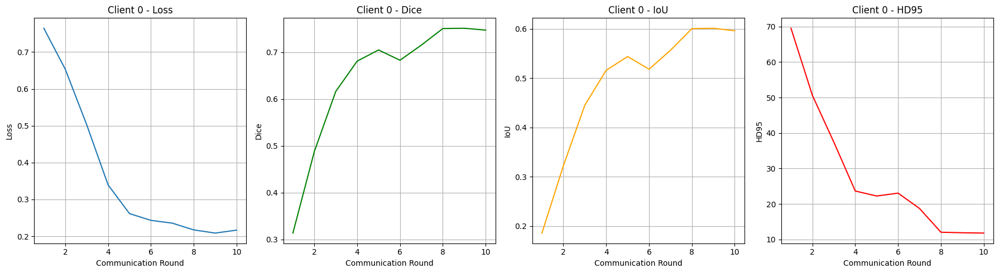

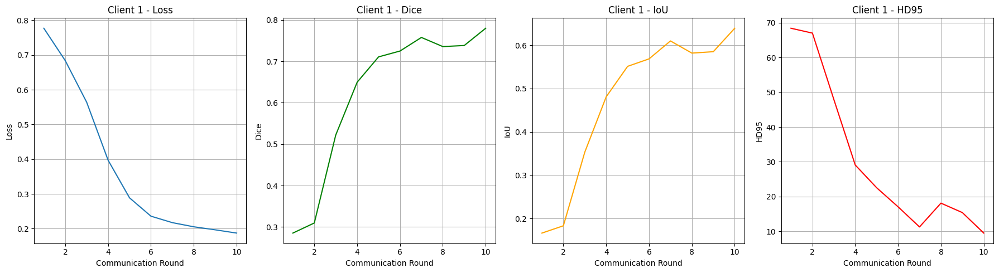

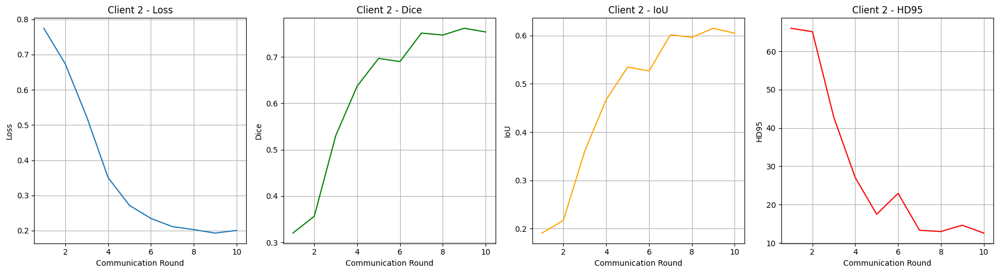

In [21]:
#local clients per communication round

for client_id, metrics in client_history.items():

    rounds = range(1, len(metrics["dice"]) + 1)

    plt.figure(figsize=(18, 5))

    # ----------------------------
    # Loss
    # ----------------------------
    plt.subplot(1, 4, 1)
    plt.plot(rounds, metrics["loss"])
    plt.xlabel("Communication Round")
    plt.ylabel("Loss")
    plt.title(f"Client {client_id} - Loss")
    plt.grid(True)

    # ----------------------------
    # Dice
    # ----------------------------
    plt.subplot(1, 4, 2)
    plt.plot(rounds, metrics["dice"], color="green")
    plt.xlabel("Communication Round")
    plt.ylabel("Dice")
    plt.title(f"Client {client_id} - Dice")
    plt.grid(True)

    # ----------------------------
    # IoU
    # ----------------------------
    plt.subplot(1, 4, 3)
    plt.plot(rounds, metrics["iou"], color="orange")
    plt.xlabel("Communication Round")
    plt.ylabel("IoU")
    plt.title(f"Client {client_id} - IoU")
    plt.grid(True)

    # ----------------------------
    # HD95
    # ----------------------------
    plt.subplot(1, 4, 4)
    plt.plot(rounds, metrics["hd95"], color="red")
    plt.xlabel("Communication Round")
    plt.ylabel("HD95")
    plt.title(f"Client {client_id} - HD95")
    plt.grid(True)

    plt.tight_layout()
    plt.show()

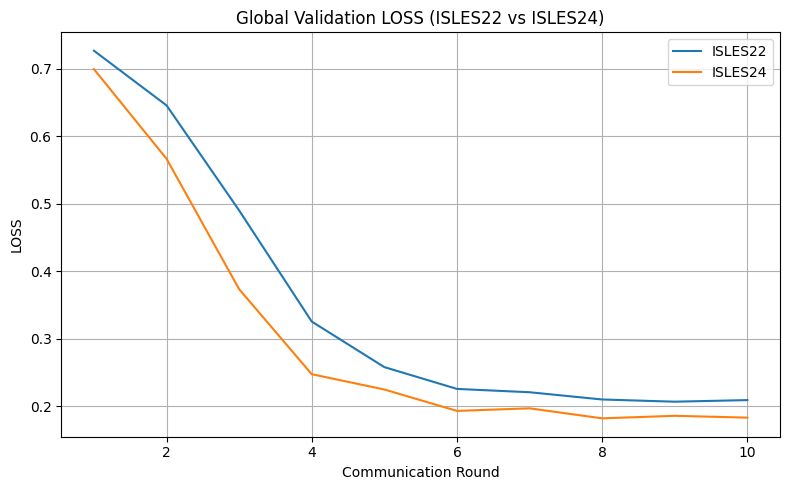

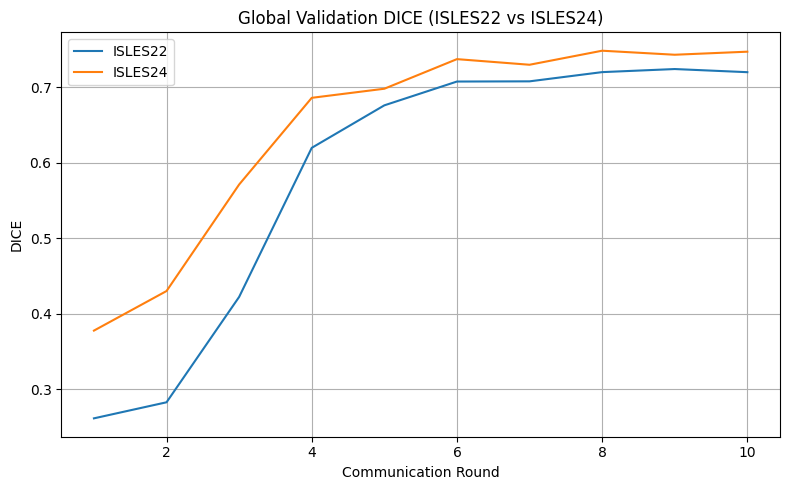

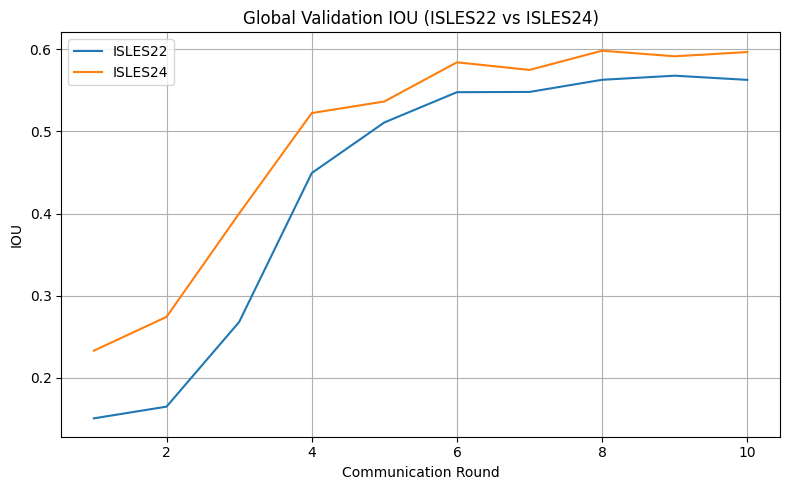

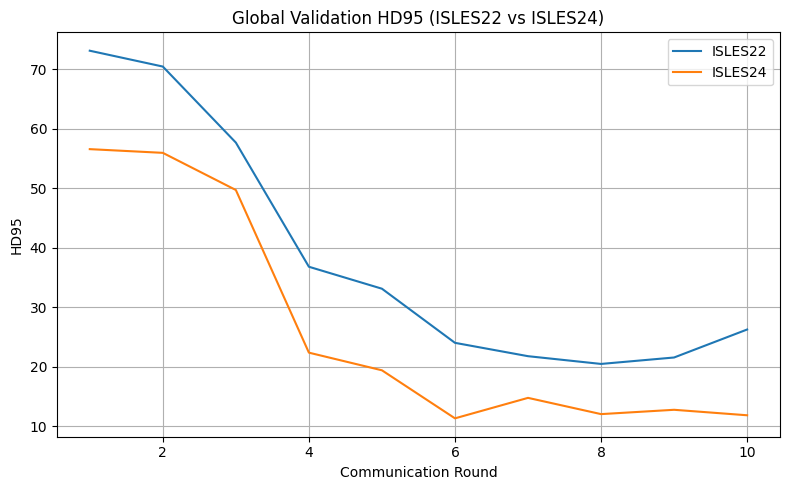

In [22]:
# -----------------------------
# Global Validation Curves
# ISLES22 vs ISLES24
# -----------------------------

metrics_to_plot = ["loss", "dice", "iou", "hd95"]

for metric in metrics_to_plot:

    plt.figure(figsize=(8, 5))

    for dataset_name, metrics in global_history.items():

        # safety check
        if metric not in metrics:
            continue

        rounds = range(1, len(metrics[metric]) + 1)

        plt.plot(
            rounds,
            metrics[metric],
            label=dataset_name
        )

    plt.xlabel("Communication Round")
    plt.ylabel(metric.upper())
    plt.title(f"Global Validation {metric.upper()} (ISLES22 vs ISLES24)")
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

**Test Set and Segmentation**

In [23]:
# -----------------------------
# 1️⃣ Load test set
# -----------------------------
test_sets = {
    "ISLES22": "D:/F25-156/Combined/ISLES22 Split 75 Preprocessed/test",
    "ISLES24": "D:/F25-156/Combined/ISLES24 Split 100 Preprocessed/test",
}
test_loaders = {}

for name, path in test_sets.items():

    test_dwi, test_masks = load_dwi_mask_pairs(path)

    test_dataset = ISLESDataset(
        dwi_files=test_dwi,
        mask_files=test_masks,
        transform=transform,
    )

    loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

    test_loaders[name] = loader

    print(f"{name} test samples: {len(dataset)}")


# -----------------------------
# 2️⃣ Load best global model
# -----------------------------
best_model_ckpt = torch.load("best_global_model.pth")
global_model = create_model().to(device)
global_model.load_state_dict(best_model_ckpt["model_state_dict"])
global_model.eval()

# -----------------------------
# 3️⃣ Metrics setup
# -----------------------------
dice_metric = DiceMetric(include_background=False, reduction="mean")
hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")
results={}

# -----------------------------
# 4️⃣ Evaluate on test set
# -----------------------------
for name, loader in test_loaders.items():

    dice_metric.reset()
    hd_metric.reset()

    with torch.no_grad():
        for batch in tqdm(loader, desc=f"Testing {name}"):

            images = batch["image"].to(device, dtype=torch.float32)
            masks = batch["mask"].to(device, dtype=torch.float32)

            outputs = global_model(images)
            preds = (torch.sigmoid(outputs) > 0.5).float()

            dice_metric(preds, masks)
            hd_metric(preds, masks)

    dice = dice_metric.aggregate().item()

    try:
        hd95 = hd_metric.aggregate().item()
    except:
        hd95 = float("nan")

    iou = dice / (2 - dice)

    results[name] = {
        "dice": dice,
        "iou": iou,
        "hd95": hd95
    }

    print(f"\n{name} Test Results:")
    print(f"Dice: {dice:.4f} | IoU: {iou:.4f} | HD95: {hd95:.4f}")

C:\Users\LAB.LAB12-PC14.000\AppData\Local\Temp\ipykernel_16052\2137765186.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best_model_ckpt = torch.load("best_global_mode

ISLES22 test samples: 24
ISLES24 test samples: 24
SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e-05, affine=Tr

Testing ISLES22:  54%|█████▍    | 27/50 [00:16<00:13,  1.65it/s]c:\Users\LAB.LAB12-PC14.000\AppData\Local\Programs\Python\Python311\Lib\site-packages\monai\metrics\utils.py:327: UserWarning: the ground truth of class 0 is all 0, this may result in nan/inf distance.
  warnings.warn(
Testing ISLES22: 100%|██████████| 50/50 [00:31<00:00,  1.58it/s]



ISLES22 Test Results:
Dice: 0.6749 | IoU: 0.5094 | HD95: 19.3545


Testing ISLES24: 100%|██████████| 25/25 [00:16<00:00,  1.51it/s]


ISLES24 Test Results:
Dice: 0.6785 | IoU: 0.5135 | HD95: 15.4096


**Visualize**


Visualizing dataset: ISLES22


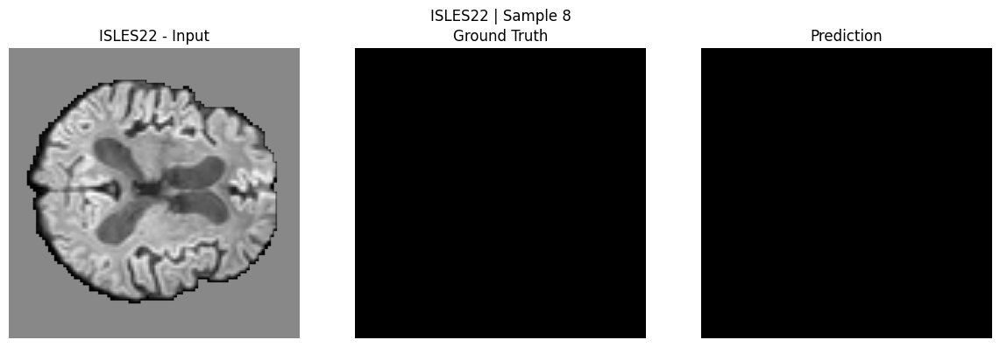

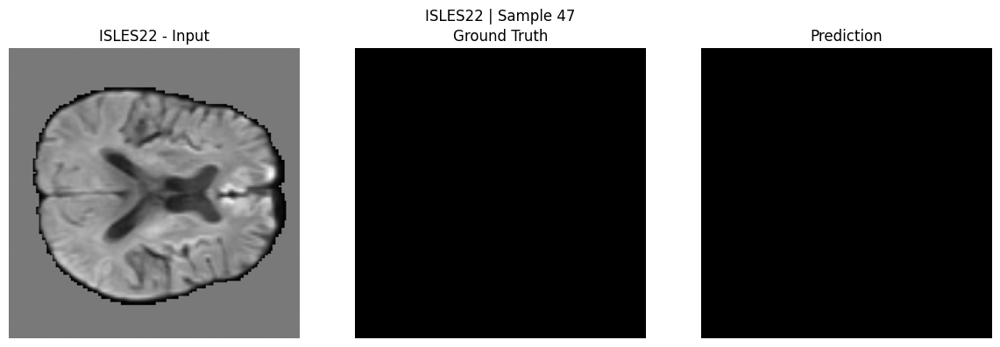

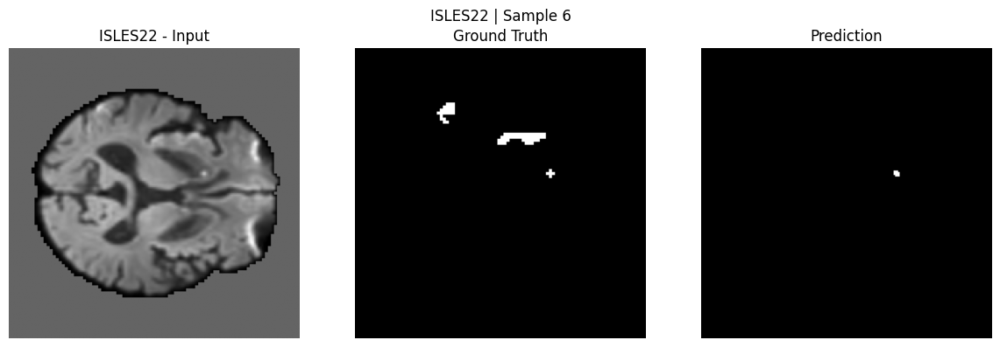

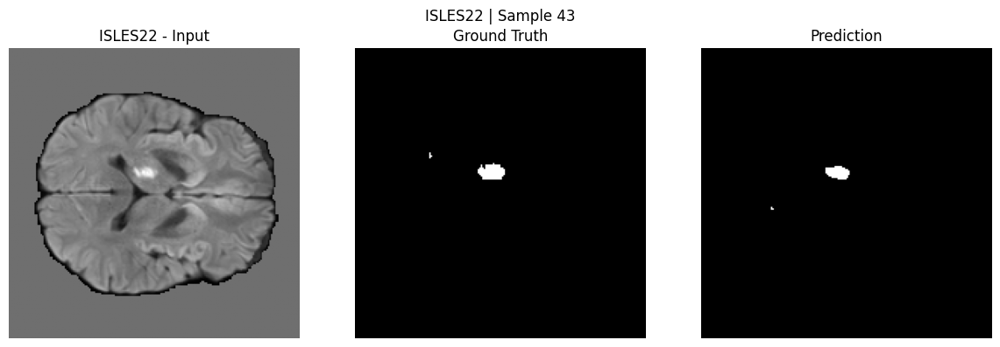

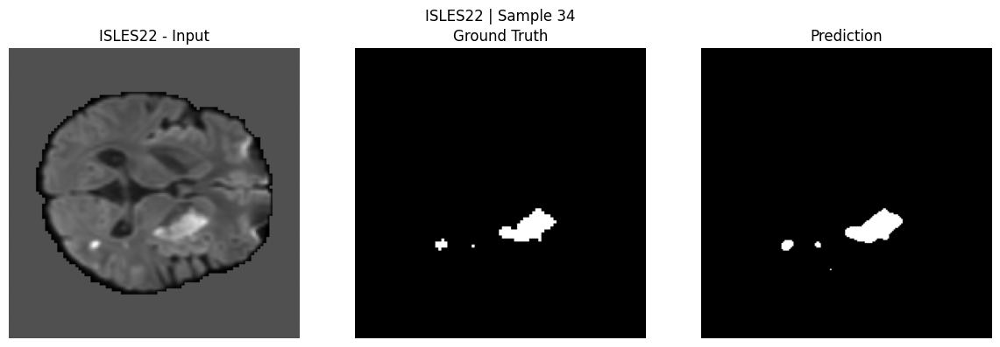


Visualizing dataset: ISLES24


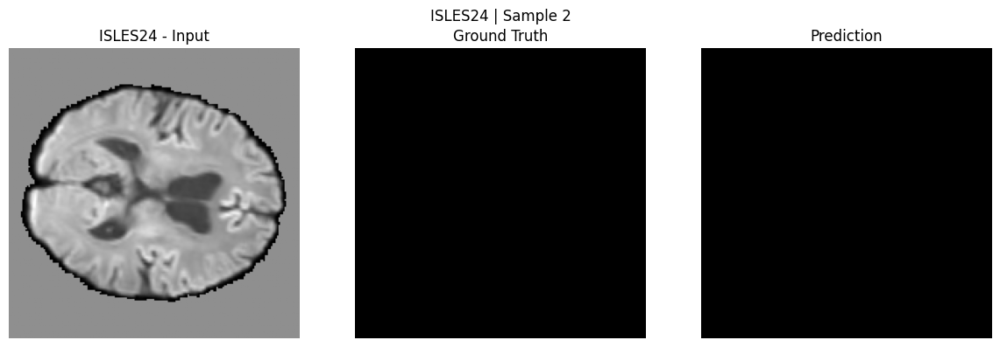

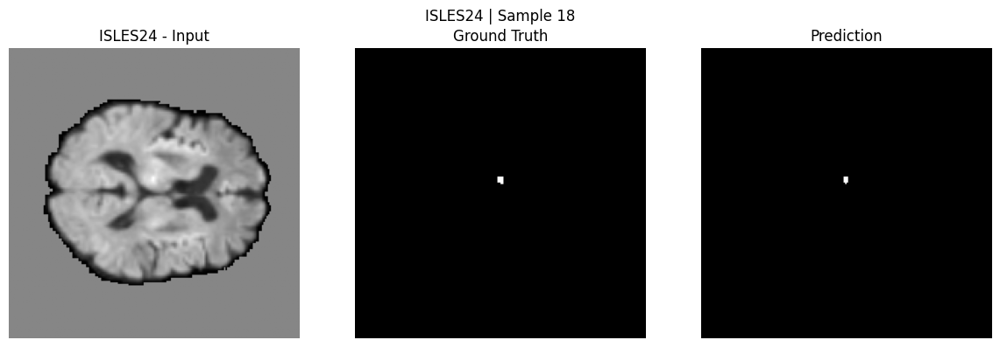

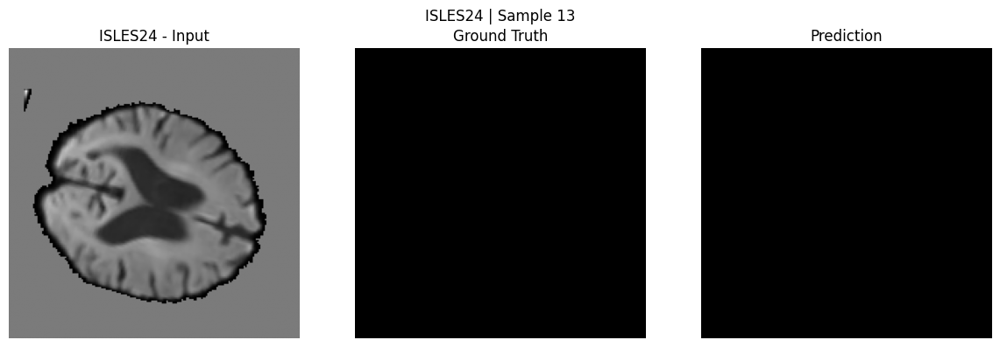

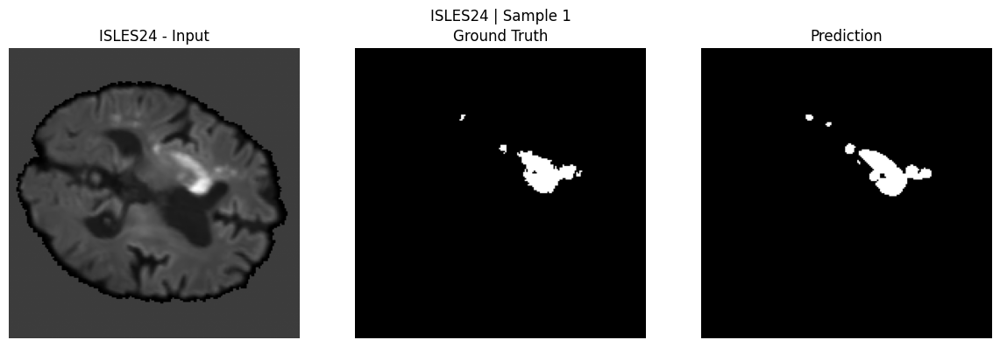

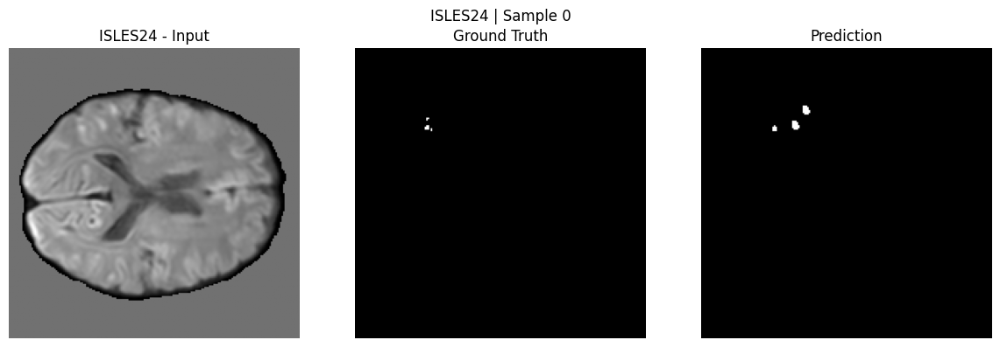

In [24]:
global_model.eval()

for dataset_name, loader in test_loaders.items():

    print(f"\nVisualizing dataset: {dataset_name}")

    dataset = loader.dataset  # get underlying dataset

    num_visualize = min(5, len(dataset))
    indices = random.sample(range(len(dataset)), num_visualize)

    for i in indices:

        sample = dataset[i]

        # -----------------------------
        # Input tensor
        # -----------------------------
        image_tensor = sample["image"].unsqueeze(0).to(device, dtype=torch.float32)

        # -----------------------------
        # Ground truth
        # -----------------------------
        image = sample["image"][0].cpu().numpy()
        mask  = sample["mask"][0].cpu().numpy()

        # -----------------------------
        # Prediction
        # -----------------------------
        with torch.no_grad():
            output = global_model(image_tensor)
            prob = torch.sigmoid(output)[0, 0].cpu().numpy()
            pred = (prob > 0.5).astype(np.float32)

        # -----------------------------
        # Middle slice
        # -----------------------------
        mid = image.shape[2] // 2

        img_slice  = image[:, :, mid]
        mask_slice = mask[:, :, mid]
        pred_slice = pred[:, :, mid]

        # -----------------------------
        # Plot
        # -----------------------------
        plt.figure(figsize=(12,4))

        plt.subplot(1,3,1)
        plt.imshow(img_slice, cmap="gray")
        plt.title(f"{dataset_name} - Input")
        plt.axis("off")

        plt.subplot(1,3,2)
        plt.imshow(mask_slice, cmap="gray")
        plt.title("Ground Truth")
        plt.axis("off")

        plt.subplot(1,3,3)
        plt.imshow(pred_slice, cmap="gray")
        plt.title("Prediction")
        plt.axis("off")

        plt.suptitle(f"{dataset_name} | Sample {i}")
        plt.tight_layout()
        plt.show()

## Personalization

In [25]:
# SEND GLOBAL MODEL TO CLIENTS
global_state = server.global_model.state_dict()

In [26]:
personalized_results = {}

for client in clients:

    print(f"\n🔵 Personalizing Client {client.id}")

    # load global model weights
    client.set_parameters(global_state)

    # fine-tune locally (personalization)
    result = client.train_epochs_personalization(num_epochs=5)

    personalized_results[client.id] = result

    # save client model
    torch.save({
        "client_id": client.id,
        "model_state_dict": client.model.state_dict(),
        "personalized_metrics": result
    }, f"client_{client.id}_personalized.pth")

    print(f"Saved Client {client.id} personalized model")

    # -----------------------------
    # ✅ PRINT RESULTS
    # -----------------------------
    print(f"\n📊 Client {client.id} Personalization Results:")
    print(f"Loss : {result['loss']:.4f}")
    print(f"Dice : {result['dice']:.4f}")
    print(f"IoU  : {result['iou']:.4f}")
    print(f"HD95 : {result['hd95']:.4f}")
    print("-" * 50)


print("\n================ PERSONALIZATION SUMMARY ================\n")

for cid, r in personalized_results.items():
    print(
        f"Client {cid} | "
        f"Loss={r['loss']:.4f} | "
        f"Dice={r['dice']:.4f} | "
        f"IoU={r['iou']:.4f} | "
        f"HD95={r['hd95']:.4f}"
    )


🔵 Personalizing Client 0


Client 0 Epochs:  20%|██        | 1/5 [02:13<08:53, 133.44s/it]

Client 0 | Epoch 1/5 | Loss: 0.2146 | Dice: 0.7219 | IoU: 0.5649 | HD95: 12.9468


Client 0 Epochs:  40%|████      | 2/5 [04:27<06:41, 133.81s/it]

Client 0 | Epoch 2/5 | Loss: 0.2305 | Dice: 0.7007 | IoU: 0.5393 | HD95: 17.9225


Client 0 Epochs:  60%|██████    | 3/5 [06:42<04:28, 134.16s/it]

Client 0 | Epoch 3/5 | Loss: 0.2087 | Dice: 0.7308 | IoU: 0.5758 | HD95: 16.9699


Client 0 Epochs:  80%|████████  | 4/5 [08:54<02:13, 133.52s/it]

Client 0 | Epoch 4/5 | Loss: 0.1958 | Dice: 0.7492 | IoU: 0.5989 | HD95: 11.9122


Client 0 Epochs: 100%|██████████| 5/5 [11:06<00:00, 133.39s/it]


Client 0 | Epoch 5/5 | Loss: 0.1895 | Dice: 0.7584 | IoU: 0.6109 | HD95: 9.8423
Saved Client 0 personalized model

📊 Client 0 Personalization Results:
Loss : 0.2078
Dice : 0.7584
IoU  : 0.6109
HD95 : 9.8423
--------------------------------------------------

🔵 Personalizing Client 1


Client 1 Epochs:  20%|██        | 1/5 [01:41<06:46, 101.61s/it]

Client 1 | Epoch 1/5 | Loss: 0.1829 | Dice: 0.7562 | IoU: 0.6080 | HD95: 15.1516


Client 1 Epochs:  40%|████      | 2/5 [03:20<04:59, 99.99s/it] 

Client 1 | Epoch 2/5 | Loss: 0.1999 | Dice: 0.7309 | IoU: 0.5760 | HD95: 14.8897


Client 1 Epochs:  60%|██████    | 3/5 [04:59<03:18, 99.35s/it]

Client 1 | Epoch 3/5 | Loss: 0.2153 | Dice: 0.7097 | IoU: 0.5500 | HD95: 16.2552


Client 1 Epochs:  80%|████████  | 4/5 [06:37<01:39, 99.11s/it]

Client 1 | Epoch 4/5 | Loss: 0.2102 | Dice: 0.7165 | IoU: 0.5582 | HD95: 18.8351


Client 1 Epochs: 100%|██████████| 5/5 [08:16<00:00, 99.24s/it]


Client 1 | Epoch 5/5 | Loss: 0.1816 | Dice: 0.7569 | IoU: 0.6088 | HD95: 11.0353
Saved Client 1 personalized model

📊 Client 1 Personalization Results:
Loss : 0.1980
Dice : 0.7569
IoU  : 0.6088
HD95 : 11.0353
--------------------------------------------------

🔵 Personalizing Client 2


Client 2 Epochs:  20%|██        | 1/5 [01:42<06:50, 102.69s/it]

Client 2 | Epoch 1/5 | Loss: 0.1782 | Dice: 0.7522 | IoU: 0.6029 | HD95: 14.7362


Client 2 Epochs:  40%|████      | 2/5 [03:22<05:03, 101.15s/it]

Client 2 | Epoch 2/5 | Loss: 0.1729 | Dice: 0.7599 | IoU: 0.6128 | HD95: 11.3300


Client 2 Epochs:  60%|██████    | 3/5 [05:03<03:21, 100.80s/it]

Client 2 | Epoch 3/5 | Loss: 0.1889 | Dice: 0.7371 | IoU: 0.5837 | HD95: 16.3449


Client 2 Epochs:  80%|████████  | 4/5 [06:43<01:40, 100.50s/it]

Client 2 | Epoch 4/5 | Loss: 0.1720 | Dice: 0.7614 | IoU: 0.6148 | HD95: 12.1813


Client 2 Epochs: 100%|██████████| 5/5 [08:23<00:00, 100.61s/it]

Client 2 | Epoch 5/5 | Loss: 0.1743 | Dice: 0.7576 | IoU: 0.6097 | HD95: 14.6632
Saved Client 2 personalized model

📊 Client 2 Personalization Results:
Loss : 0.1772
Dice : 0.7576
IoU  : 0.6097
HD95 : 14.6632
--------------------------------------------------

================ PERSONALIZATION SUMMARY ================

Client 0 | Loss=0.2078 | Dice=0.7584 | IoU=0.6109 | HD95=9.8423
Client 1 | Loss=0.1980 | Dice=0.7569 | IoU=0.6088 | HD95=11.0353
Client 2 | Loss=0.1772 | Dice=0.7576 | IoU=0.6097 | HD95=14.6632


In [27]:
def valuate_model(model, loader, device):

    model.eval()

    dice_metric = DiceMetric(include_background=False, reduction="mean")
    hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

    with torch.no_grad():
        for batch in loader:

            images = batch["image"].to(device, dtype=torch.float32)
            masks = batch["mask"].to(device, dtype=torch.float32)

            outputs = model(images)
            preds = (torch.sigmoid(outputs) > 0.5).float()

            dice_metric(preds, masks)
            hd_metric(preds, masks)

    dice = dice_metric.aggregate().item()

    try:
        hd95 = hd_metric.aggregate().item()
    except:
        hd95 = float("nan")

    iou = dice / (2 - dice)

    return {
        "dice": dice,
        "iou": iou,
        "hd95": hd95
    }

Validation

In [28]:
client_val_results = {}

for client in clients:

    print(f"\n🟡 Validating Client {client.id}")

    # load personalized model
    ckpt = torch.load(f"client_{client.id}_personalized.pth")

    model = create_model().to(device)
    model.load_state_dict(ckpt["model_state_dict"])

    client_val_results[client.id] = {}

    for name, loader in val_loaders.items():

        metrics = valuate_model(model, loader, device)

        client_val_results[client.id][name] = metrics

        print(
            f"{name} VAL | "
            f"Dice={metrics['dice']:.4f} | "
            f"IoU={metrics['iou']:.4f} | "
            f"HD95={metrics['hd95']:.4f}"
        )
        
print("\n================ VALIDATION SUMMARY ================\n")

for cid, res in client_val_results.items():

    print(f"\nClient {cid}")

    for ds, m in res.items():
        print(
            f"{ds} | "
            f"Dice={m['dice']:.4f} | "
            f"IoU={m['iou']:.4f} | "
            f"HD95={m['hd95']:.4f}"
        )


🟡 Validating Client 0
SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (norm2): GroupN

C:\Users\LAB.LAB12-PC14.000\AppData\Local\Temp\ipykernel_16052\2214001518.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(f"client_{client.id}_personal

ISLES22 VAL | Dice=0.6844 | IoU=0.5202 | HD95=16.0842
ISLES24 VAL | Dice=0.7361 | IoU=0.5824 | HD95=13.4383

🟡 Validating Client 1
SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
  

Testing

In [29]:
client_test_results = {}

for client in clients:

    print(f"\n🔵 Testing Client {client.id}")

    # load personalized model
    ckpt = torch.load(f"client_{client.id}_personalized.pth")

    model = create_model().to(device)
    model.load_state_dict(ckpt["model_state_dict"])

    client_test_results[client.id] = {}

    for name, loader in test_loaders.items():

        metrics = valuate_model(model, loader, device)

        client_test_results[client.id][name] = metrics

        print(
            f"{name} TEST | "
            f"Dice={metrics['dice']:.4f} | "
            f"IoU={metrics['iou']:.4f} | "
            f"HD95={metrics['hd95']:.4f}"
        )
        
print("\n================ TEST RESULTS SUMMARY ================\n")

for cid, res in client_test_results.items():

    print(f"\nClient {cid}")

    for ds, m in res.items():
        print(
            f"{ds} TEST | "
            f"Dice={m['dice']:.4f} | "
            f"IoU={m['iou']:.4f} | "
            f"HD95={m['hd95']:.4f}"
        )


🔵 Testing Client 0
SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (norm2): GroupNorm

C:\Users\LAB.LAB12-PC14.000\AppData\Local\Temp\ipykernel_16052\669573348.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(f"client_{client.id}_personali

ISLES22 TEST | Dice=0.6152 | IoU=0.4442 | HD95=17.3664
ISLES24 TEST | Dice=0.6450 | IoU=0.4760 | HD95=13.3411

🔵 Testing Client 1
SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
   